<a href="https://colab.research.google.com/github/HAN-GEONHUI/test/blob/t_academy_%EC%88%98%EC%97%85_pandas/world_happy_eda_ex_(240905).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 0) 필요한 패키지들

In [ ]:
import numpy as np
import pandas as pd
import os
import glob
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
#Interactive charts and maps for Python,
# https://anaconda.org/plotly/plotly
# conda install -c plotly plotly

# 참고 : https://wikidocs.net/180747

In [ ]:
# plotly의 2가지에 대한 방식 : express // graph_objects
# express : 데이터 입력만으로 쉽게 그래프 표현 가능 but 세부조정이 어려움
# graph_objects : 그래프의 세부적인 조정이 용이하지만,
#                 세부적인 모든 것들을 다 설정해야하므로 코드 양이 많아짐;;ㅠ
# plotly 는 매뉴얼이 그닥;;ㅠㅠ
import plotly.express as px
import plotly.graph_objects as go
# 혹시 주피터 노트북에 안 나타날 경우에 대해서
from plotly.offline import init_notebook_mode, iplot

# 1) 데이터 원천 : World Happiness Report 2022
https://worldhappiness.report/ <br>
중간 아래에 `APPENDICES&DATA`클릭 하여 데이터를 다운로드 받으면 됨.<br>
* Statistical Appendix 1 for Chapter 2 : 변수들 설명 <br>
* Data for Figure 2.1 : 2022년도 자료
* Data for Table 2.1 : 과거부터 2021년까지 나라별 년도에 따라서 정리된 자료<br>

` 참고 ` 지난 년도들에서 사용하는 변수들의 이름과 2022년도에서 사용하는 변수의 이름이 변경이 이루어져 있으며, kaggle 등에서 확인할 수 있는 자료들을 지난 과거의 자료들과 과거 변수명들로 되어 있으므로, 최신의 자료르 하게 되면 해당하는 부분에 차이점이 존재하는 것을 염두할 것!!!

In [ ]:
from IPython.display import Image

<>:2: SyntaxWarning:

invalid escape sequence '\i'

<>:2: SyntaxWarning:

invalid escape sequence '\i'

C:\Users\NT551_11TH\AppData\Local\Temp\ipykernel_6304\1241177125.py:2: SyntaxWarning:

invalid escape sequence '\i'



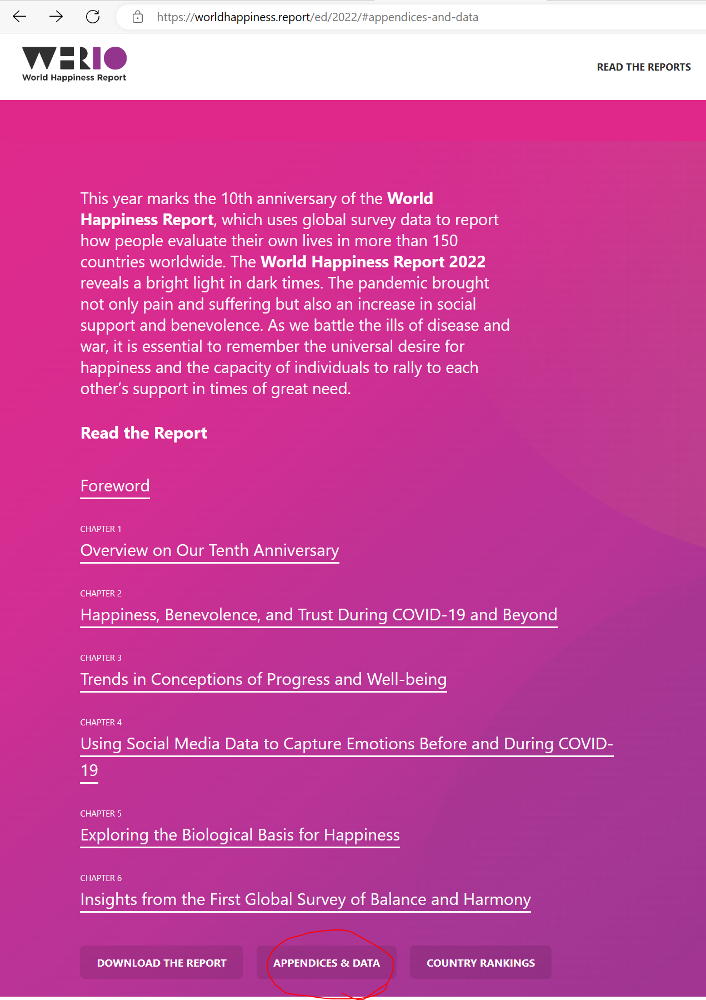

In [ ]:
from IPython.display import Image
image_path = 'img\img_01.png'
img = Image(filename=image_path)
display(img)

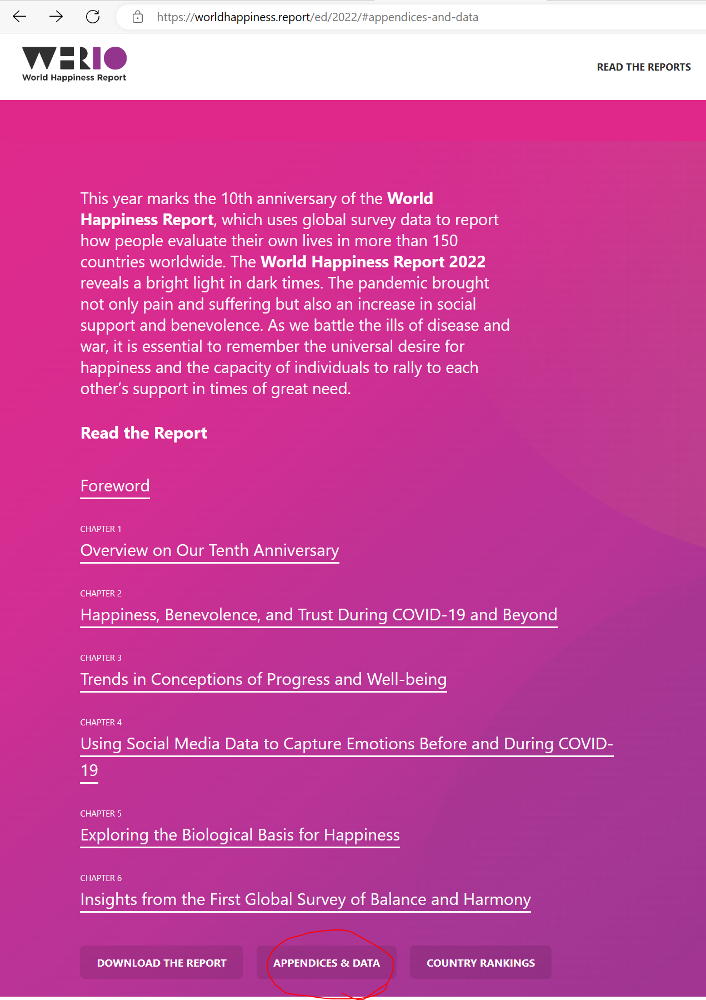

In [ ]:
Image("img/img_01.png")

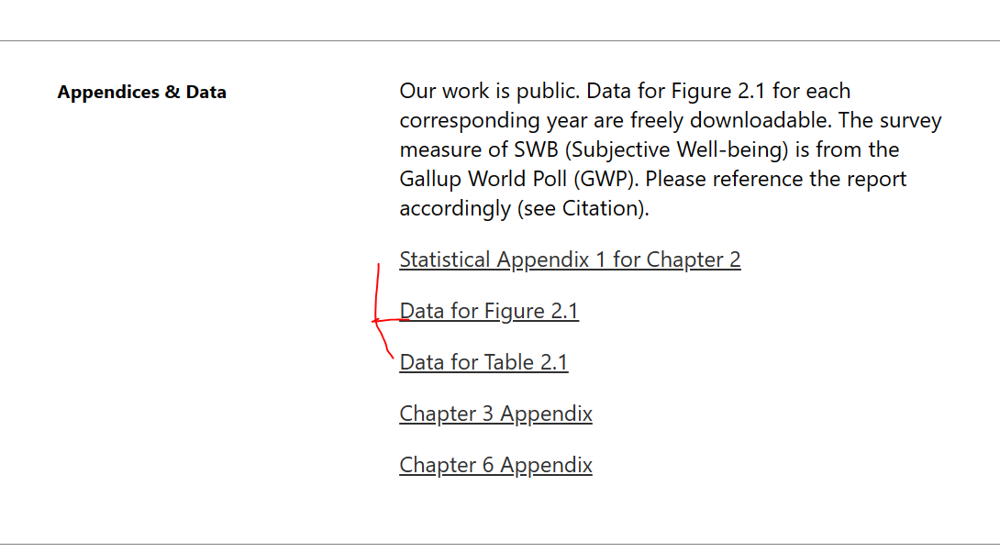

In [ ]:
Image("img/img_02.png")

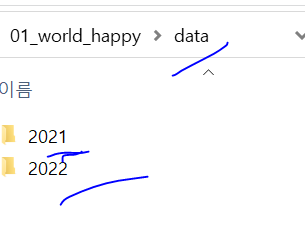

In [ ]:
Image("img/img_06.png")

In [ ]:
import os
print(os.getcwd())

C:\Users\NT551_11TH


In [ ]:
#  data files의 경로 지정
# python 에서 file 및 os 관련 참고 사이트
# https://pynative.com/python-list-files-in-a-directory/
# https://www.pythoncheatsheet.org/cheatsheet/file-directory-path

data_pattern = "data/2022/*.xls" #찾을 패턴을 지정
data_file_list = glob.glob(data_pattern,recursive=True) #recursive--> 하위 폴더까지 할지 말지
data_file_list

['data/2022\\Appendix_2_Data_for_Figure_2.1.xls',
 'data/2022\\DataForTable2.1.xls']

In [ ]:
#!pip install xlrd

## word_happiness_report파일 불러오기<br>
* 2022년도의 자료는 Appendix_2_Data_for_Figure_2.1.xls --> data_happy의 변수 이름 설정<br>
* 2021년도 이전 년도의 자료는 DataForTable2.1.xls      --> data_happy_log의 변수 이름 설정<br>

#### 1-1) 2022년도의 자료만 불러오기

In [ ]:
# 2022년도 최근 년도에 대한 데이터
happy_path = data_file_list[0]
data_happy = pd.read_excel(happy_path,sheet_name="2022") # dn
data_happy.head()


,RANK,Country,Happiness score,Whisker-high,Whisker-low,Dystopia (1.83) + residual,Explained by: GDP per capita,Explained by: Social support,Explained by: Healthy life expectancy,Explained by: Freedom to make life choices,Explained by: Generosity,Explained by: Perceptions of corruption
0,1,Finland,7.8210,7.886425,7.755575,2.518052,1.891628,1.258108,0.775206,0.735590,0.108733,0.533658
1,2,Denmark,7.6362,7.709897,7.562503,2.225632,1.952595,1.242681,0.776644,0.718918,0.187626,0.532079
2,3,Iceland,7.5575,7.651076,7.463924,2.320185,1.935726,1.319914,0.802622,0.718194,0.269616,0.191204
3,4,Switzerland,7.5116,7.586394,7.436806,2.152746,2.025970,1.226074,0.822048,0.676947,0.146822,0.461004
4,5,Netherlands,7.4149,7.471265,7.358534,2.136937,1.944578,1.205848,0.786738,0.650682,0.271076,0.419083


In [ ]:
# 위의 컬럼 설명 : Statistical Appendix 1 for Chapter 2 의 문서 파일 참조할 것!!!!

In [ ]:
data_happy.tail()

,RANK,Country,Happiness score,Whisker-high,Whisker-low,Dystopia (1.83) + residual,Explained by: GDP per capita,Explained by: Social support,Explained by: Healthy life expectancy,Explained by: Freedom to make life choices,Explained by: Generosity,Explained by: Perceptions of corruption
142,143,Rwanda*,3.2682,3.462218,3.074182,0.536299,0.785252,0.132698,0.461527,0.621479,0.186662,0.544236
143,144,Zimbabwe,2.9951,3.109822,2.880378,0.547529,0.946604,0.690460,0.270086,0.329203,0.106265,0.104943
144,145,Lebanon,2.9553,3.048951,2.861649,0.215537,1.392068,0.497999,0.630964,0.102799,0.082191,0.033761
145,146,Afghanistan,2.4038,2.468731,2.338869,1.263403,0.757994,0.000000,0.288626,0.000000,0.088873,0.004882
146,147,xx,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
data_happy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 147 entries, 0 to 146
Data columns (total 12 columns):
 #   Column                                      Non-Null Count  Dtype  
---  ------                                      --------------  -----  
 0   RANK                                        147 non-null    int64  
 1   Country                                     147 non-null    object 
 2   Happiness score                             146 non-null    float64
 3   Whisker-high                                146 non-null    float64
 4   Whisker-low                                 146 non-null    float64
 5   Dystopia (1.83) + residual                  146 non-null    float64
 6   Explained by: GDP per capita                146 non-null    float64
 7   Explained by: Social support                146 non-null    float64
 8   Explained by: Healthy life expectancy       146 non-null    float64
 9   Explained by: Freedom to make life choices  146 non-null    float64
 10  Explained by: 

In [ ]:
data_happy.describe()
# ==> 그래프로 볼 때 ; boxplot, viloinplot etc

,RANK,Happiness score,Whisker-high,Whisker-low,Dystopia (1.83) + residual,Explained by: GDP per capita,Explained by: Social support,Explained by: Healthy life expectancy,Explained by: Freedom to make life choices,Explained by: Generosity,Explained by: Perceptions of corruption
count,147.000000,146.000000,146.000000,146.000000,146.000000,146.000000,146.000000,146.000000,146.000000,146.000000,146.000000
mean,74.000000,5.553575,5.673613,5.433538,1.831807,1.410429,0.905834,0.586146,0.517225,0.147372,0.154758
std,42.579338,1.086814,1.065649,1.109374,0.534971,0.421655,0.280123,0.176352,0.145833,0.082763,0.127522
min,1.000000,2.403800,2.468731,2.338869,0.187416,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,37.500000,4.888550,5.006018,4.754731,1.555475,1.095578,0.732114,0.462953,0.440506,0.088723,0.068087
50%,74.000000,5.568700,5.680081,5.453245,1.894558,1.445134,0.957799,0.621445,0.543633,0.132417,0.119459
75%,110.500000,6.305025,6.448932,6.189783,2.152897,1.785087,1.114658,0.720065,0.625763,0.197554,0.198213
max,147.000000,7.821000,7.886425,7.755575,2.844388,2.209395,1.319914,0.941829,0.740039,0.467926,0.586828


In [ ]:
# 숫치형이 아닌 것들에 대한 자료들에 대한 확인!!!
# ---> 나라들의 이름에서 중복되는 나라는 없이
#      전세계의 147개국에서 이루어진 것을 알 수 있음!!!!
data_happy.describe( include=["object"])

,Country
count,147
unique,147
top,Finland
freq,1


#### 1-2) 2022년도 이전의 자료들을 불러오기

In [ ]:
# 2022년도 이전의 결과 파일들 불러오기..
happy_re_path = data_file_list[1]
data_happy_log=pd.read_excel(happy_re_path)
data_happy_log.head()

,Country name,year,Life Ladder,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Generosity,Perceptions of corruption,Positive affect,Negative affect,Confidence in national government
0,Afghanistan,2008,3.723590,7.302574,0.450662,50.500000,0.718114,0.173169,0.881686,0.414297,0.258195,0.612072
1,Afghanistan,2009,4.401778,7.472446,0.552308,50.799999,0.678896,0.195469,0.850035,0.481421,0.237092,0.611545
2,Afghanistan,2010,4.758381,7.579183,0.539075,51.099998,0.600127,0.125859,0.706766,0.516907,0.275324,0.299357
3,Afghanistan,2011,3.831719,7.552006,0.521104,51.400002,0.495901,0.167723,0.731109,0.479835,0.267175,0.307386
4,Afghanistan,2012,3.782938,7.637953,0.520637,51.700001,0.530935,0.241247,0.775620,0.613513,0.267919,0.435440


In [ ]:
data_happy_log.describe()

,year,Life Ladder,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Generosity,Perceptions of corruption,Positive affect,Negative affect,Confidence in national government
count,2089.000000,2089.000000,2062.000000,2076.000000,2031.000000,2057.000000,2009.000000,1976.000000,2065.000000,2073.000000,1873.000000
mean,2013.727621,5.473747,9.378408,0.811542,63.180326,0.745462,0.000102,0.746474,0.651421,0.270544,0.483914
std,4.455614,1.115567,1.143520,0.118935,6.948546,0.140751,0.161082,0.186136,0.105954,0.085849,0.191515
min,2005.000000,2.178809,5.526723,0.290184,6.720000,0.257534,-0.335739,0.035198,0.178886,0.082737,0.068769
25%,2010.000000,4.651972,8.473547,0.747664,58.965000,0.651689,-0.113172,0.689840,0.570057,0.207652,0.334808
50%,2014.000000,5.405246,9.463269,0.834770,64.980003,0.767357,-0.023366,0.801339,0.662837,0.260328,0.467046
75%,2017.000000,6.294282,10.347656,0.904682,68.362499,0.857677,0.090584,0.870789,0.737176,0.321706,0.616302
max,2021.000000,8.018934,11.665803,0.987343,74.349998,0.985178,0.706377,0.983276,0.883586,0.704590,0.993604


In [ ]:
data_happy_log.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2089 entries, 0 to 2088
Data columns (total 12 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   Country name                       2089 non-null   object 
 1   year                               2089 non-null   int64  
 2   Life Ladder                        2089 non-null   float64
 3   Log GDP per capita                 2062 non-null   float64
 4   Social support                     2076 non-null   float64
 5   Healthy life expectancy at birth   2031 non-null   float64
 6   Freedom to make life choices       2057 non-null   float64
 7   Generosity                         2009 non-null   float64
 8   Perceptions of corruption          1976 non-null   float64
 9   Positive affect                    2065 non-null   float64
 10  Negative affect                    2073 non-null   float64
 11  Confidence in national government  1873 non-null   float

In [ ]:
# 여기서는 나라이름이 여러개의 중복이 발생하는 것에서는
# 년도별에 대한 데이터가 축적이 되어서 그러함

# 그리고 나라들도 년도에 따라서 다른 것을 볼 수 있음!
# 2022년도에서는 147개국인데, 기존에 자료를 조사한 나라의 수는 166개국임
data_happy_log.describe(include=["object"])

,Country name
count,2089
unique,166
top,Zimbabwe
freq,16


#### 1-3) 2022년도 자료의 경우에는 맨 마지막에 이상항 데이터가 있음!! 그리고 그 이전년도하고 다르게 양식이 다르게 되었음!!

In [ ]:
# 맨 뒤에 확인을 하였으면,
data_happy.tail()

,RANK,Country,Happiness score,Whisker-high,Whisker-low,Dystopia (1.83) + residual,Explained by: GDP per capita,Explained by: Social support,Explained by: Healthy life expectancy,Explained by: Freedom to make life choices,Explained by: Generosity,Explained by: Perceptions of corruption
142,143,Rwanda*,3.2682,3.462218,3.074182,0.536299,0.785252,0.132698,0.461527,0.621479,0.186662,0.544236
143,144,Zimbabwe,2.9951,3.109822,2.880378,0.547529,0.946604,0.690460,0.270086,0.329203,0.106265,0.104943
144,145,Lebanon,2.9553,3.048951,2.861649,0.215537,1.392068,0.497999,0.630964,0.102799,0.082191,0.033761
145,146,Afghanistan,2.4038,2.468731,2.338869,1.263403,0.757994,0.000000,0.288626,0.000000,0.088873,0.004882
146,147,xx,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


# 2) data_happy 데이터 탐색

### 2-1) 나라의 고유값들 확인

In [ ]:
# 참고) 위의 describe로 봐도 가능함
len(data_happy["Country"].unique()) == len(data_happy)

True

In [ ]:
data_happy["Country"].value_counts()

Country
Finland       1
Ghana         1
Laos          1
Algeria       1
Liberia*      1
             ..
Kuwait*       1
Hungary       1
Mauritius     1
Uzbekistan    1
xx            1
Name: count, Length: 147, dtype: int64

### 2-2) 2022년도에 지역별 조사된 나라의 수 그래프

* 2021년까지 나라의 이름에서 지역 구분이 있었는데, 2022년도 자료에서는 그러한 지역에 대한 정보가 없어서...2021년 자료를 가지고 2022년의 국가에 지역에 대한 정보를 참조해서 붙여서 처리하려고 함!!

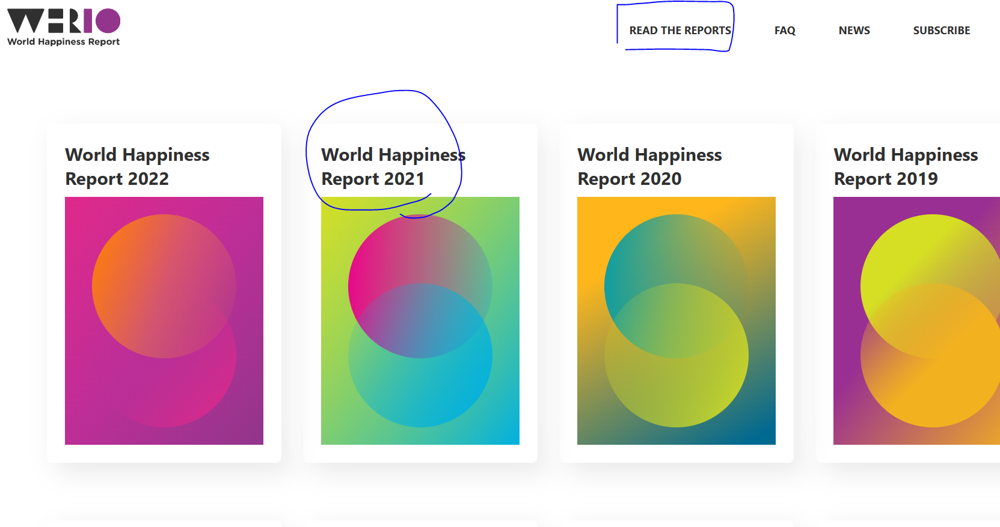

In [ ]:
Image("img/img_03.png")

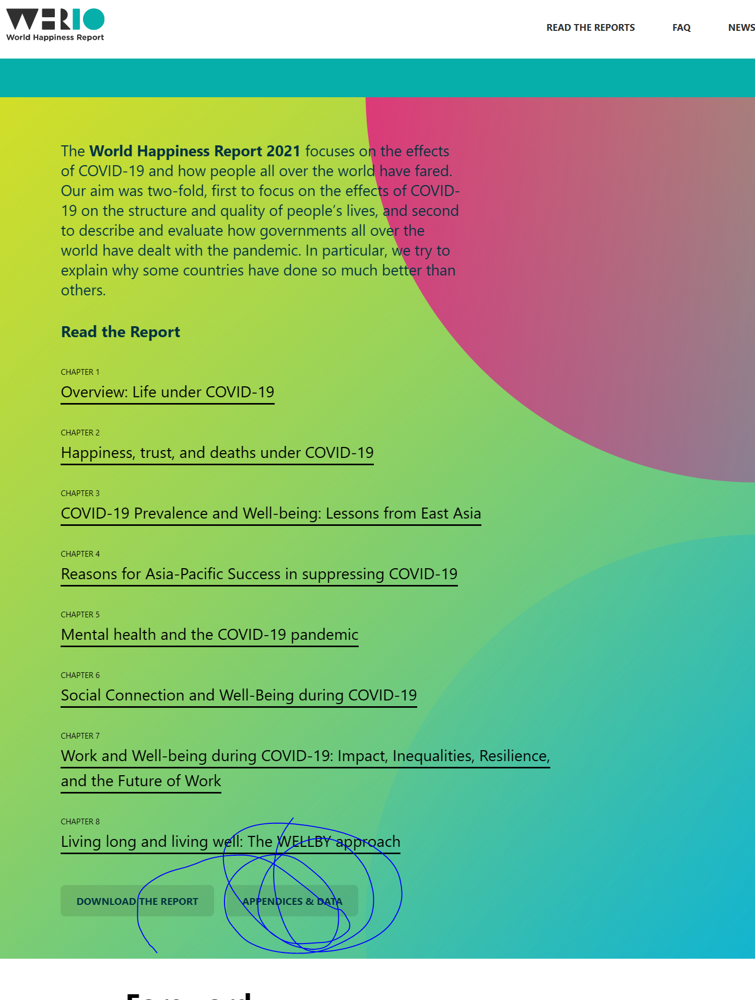

In [ ]:
Image("img/img_04.png")

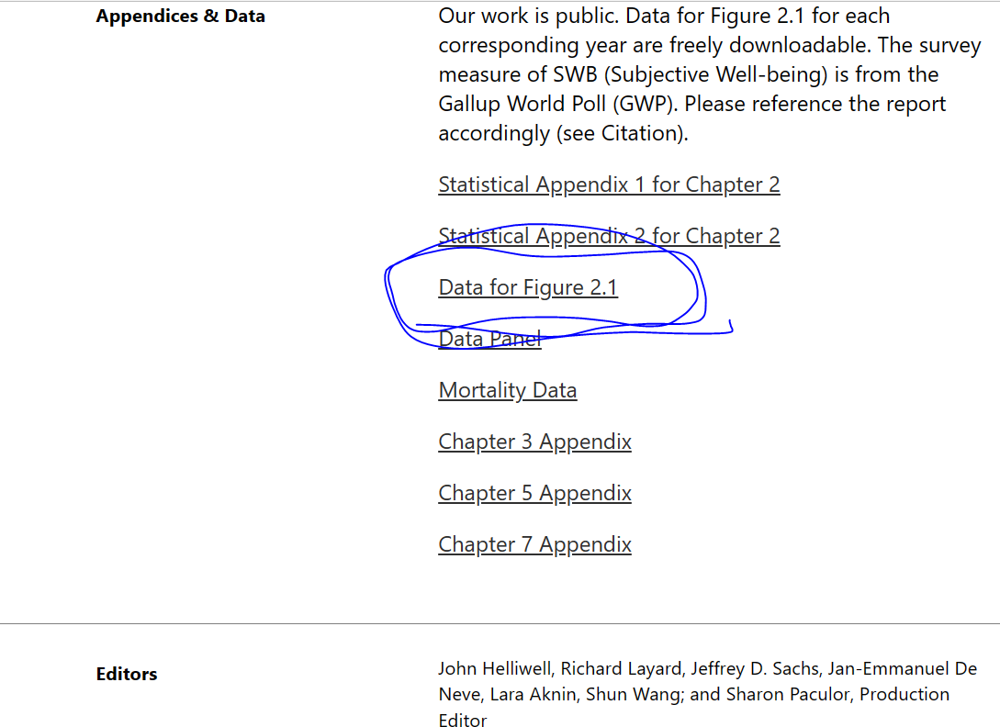

In [ ]:
Image("img/img_05.png")

* 위의 파일을 2021년 폴더에 넣어 둠!!

#### 2-2-1) 2021년 자료 불러오기

In [ ]:
# 2021년 데이터 불러오기!!! --> Regional indicator 컬럼이 있어야 함!!!!!
path_2021 =r"data\2021\DataForFigure2.1WHR2021C2.xls"
data_happy_2021 = pd.read_excel(path_2021)
data_happy_2021.head()

,Country name,Regional indicator,Ladder score,Standard error of ladder score,upperwhisker,lowerwhisker,Logged GDP per capita,Social support,Healthy life expectancy,Freedom to make life choices,Generosity,Perceptions of corruption,Ladder score in Dystopia,Explained by: Log GDP per capita,Explained by: Social support,Explained by: Healthy life expectancy,Explained by: Freedom to make life choices,Explained by: Generosity,Explained by: Perceptions of corruption,Dystopia + residual
0,Finland,Western Europe,7.8421,0.031646,7.904126,7.780075,10.775202,0.953603,72.000000,0.949268,-0.097760,0.185846,2.430343,1.446356,1.106192,0.740824,0.690577,0.124200,0.480524,3.253415
1,Denmark,Western Europe,7.6195,0.034657,7.687428,7.551572,10.933176,0.954410,72.699753,0.945639,0.030109,0.178838,2.430343,1.501548,1.108008,0.762862,0.686160,0.207615,0.484993,2.868296
2,Switzerland,Western Europe,7.5715,0.036243,7.642536,7.500463,11.117368,0.941742,74.400101,0.918788,0.024629,0.291698,2.430343,1.565899,1.079469,0.816415,0.653488,0.204040,0.413019,2.839148
3,Iceland,Western Europe,7.5539,0.059373,7.670271,7.437528,10.877768,0.982938,73.000000,0.955123,0.160274,0.672865,2.430343,1.482190,1.172279,0.772319,0.697701,0.292526,0.169940,2.966945
4,Netherlands,Western Europe,7.4640,0.027326,7.517559,7.410441,10.931812,0.941601,72.400116,0.913116,0.175404,0.337938,2.430343,1.501072,1.079151,0.753425,0.646585,0.302397,0.383531,2.797818


#### 2-2-2) 이제 2022년도 data_happy에 2021년도 자료 참고해서 붙이기!!

In [ ]:
data_happy.head()

,RANK,Country,Happiness score,Whisker-high,Whisker-low,Dystopia (1.83) + residual,Explained by: GDP per capita,Explained by: Social support,Explained by: Healthy life expectancy,Explained by: Freedom to make life choices,Explained by: Generosity,Explained by: Perceptions of corruption
0,1,Finland,7.8210,7.886425,7.755575,2.518052,1.891628,1.258108,0.775206,0.735590,0.108733,0.533658
1,2,Denmark,7.6362,7.709897,7.562503,2.225632,1.952595,1.242681,0.776644,0.718918,0.187626,0.532079
2,3,Iceland,7.5575,7.651076,7.463924,2.320185,1.935726,1.319914,0.802622,0.718194,0.269616,0.191204
3,4,Switzerland,7.5116,7.586394,7.436806,2.152746,2.025970,1.226074,0.822048,0.676947,0.146822,0.461004
4,5,Netherlands,7.4149,7.471265,7.358534,2.136937,1.944578,1.205848,0.786738,0.650682,0.271076,0.419083


In [ ]:
data_happy_2021.head()

,Country name,Regional indicator,Ladder score,Standard error of ladder score,upperwhisker,lowerwhisker,Logged GDP per capita,Social support,Healthy life expectancy,Freedom to make life choices,Generosity,Perceptions of corruption,Ladder score in Dystopia,Explained by: Log GDP per capita,Explained by: Social support,Explained by: Healthy life expectancy,Explained by: Freedom to make life choices,Explained by: Generosity,Explained by: Perceptions of corruption,Dystopia + residual
0,Finland,Western Europe,7.8421,0.031646,7.904126,7.780075,10.775202,0.953603,72.000000,0.949268,-0.097760,0.185846,2.430343,1.446356,1.106192,0.740824,0.690577,0.124200,0.480524,3.253415
1,Denmark,Western Europe,7.6195,0.034657,7.687428,7.551572,10.933176,0.954410,72.699753,0.945639,0.030109,0.178838,2.430343,1.501548,1.108008,0.762862,0.686160,0.207615,0.484993,2.868296
2,Switzerland,Western Europe,7.5715,0.036243,7.642536,7.500463,11.117368,0.941742,74.400101,0.918788,0.024629,0.291698,2.430343,1.565899,1.079469,0.816415,0.653488,0.204040,0.413019,2.839148
3,Iceland,Western Europe,7.5539,0.059373,7.670271,7.437528,10.877768,0.982938,73.000000,0.955123,0.160274,0.672865,2.430343,1.482190,1.172279,0.772319,0.697701,0.292526,0.169940,2.966945
4,Netherlands,Western Europe,7.4640,0.027326,7.517559,7.410441,10.931812,0.941601,72.400116,0.913116,0.175404,0.337938,2.430343,1.501072,1.079151,0.753425,0.646585,0.302397,0.383531,2.797818


In [ ]:
# 병합을 할 때 다른 컬럼도 같이 오게 되니....필요한 나라/지역만 추린다.
# ==> 붙이는 작업을 할 때,,크면,,,다 부담;;;속도....불필요한 컬럼은 제외를 해야하기에 컴펙트하게 필요한 것만 추려서 붙이려고 함!!!!!
cols = ["Country name", "Regional indicator"]
data_happy_2021 = data_happy_2021.loc[:, cols]
data_happy_2021.head()

,Country name,Regional indicator
0,Finland,Western Europe
1,Denmark,Western Europe
2,Switzerland,Western Europe
3,Iceland,Western Europe
4,Netherlands,Western Europe


In [ ]:
# 병합하기 : 무엇을 기준으로 할지!!, 어떤 FK 참조할지
# 2022년도의 데이터를 기준으로,,지역에 대한 정보를 추가하자!
# ==> 2022년도 데이터 기준으로 지역 정보를 참조해서 붙이자! left/right join
data_happy_tot = pd.merge( data_happy, data_happy_2021,
                         how = "left",
                         left_on="Country",
                         right_on="Country name")
data_happy_tot.head()

,RANK,Country,Happiness score,Whisker-high,Whisker-low,Dystopia (1.83) + residual,Explained by: GDP per capita,Explained by: Social support,Explained by: Healthy life expectancy,Explained by: Freedom to make life choices,Explained by: Generosity,Explained by: Perceptions of corruption,Country name,Regional indicator
0,1,Finland,7.8210,7.886425,7.755575,2.518052,1.891628,1.258108,0.775206,0.735590,0.108733,0.533658,Finland,Western Europe
1,2,Denmark,7.6362,7.709897,7.562503,2.225632,1.952595,1.242681,0.776644,0.718918,0.187626,0.532079,Denmark,Western Europe
2,3,Iceland,7.5575,7.651076,7.463924,2.320185,1.935726,1.319914,0.802622,0.718194,0.269616,0.191204,Iceland,Western Europe
3,4,Switzerland,7.5116,7.586394,7.436806,2.152746,2.025970,1.226074,0.822048,0.676947,0.146822,0.461004,Switzerland,Western Europe
4,5,Netherlands,7.4149,7.471265,7.358534,2.136937,1.944578,1.205848,0.786738,0.650682,0.271076,0.419083,Netherlands,Western Europe


In [ ]:
# 혹시 Country name 이 누락된 것은?


,RANK,Country,Happiness score,Whisker-high,Whisker-low,Dystopia (1.83) + residual,Explained by: GDP per capita,Explained by: Social support,Explained by: Healthy life expectancy,Explained by: Freedom to make life choices,Explained by: Generosity,Explained by: Perceptions of corruption,Country name,Regional indicator
5,6,Luxembourg*,7.4040,7.501348,7.306652,2.041680,2.209395,1.154525,0.790365,0.699728,0.120203,0.388120,NaN,NaN
17,18,Czechia,6.9198,7.028677,6.810923,2.262640,1.815016,1.260081,0.715006,0.660386,0.158460,0.048207,NaN,NaN
38,39,Guatemala*,6.2622,6.460113,6.064287,2.746166,1.273642,0.831088,0.522102,0.662154,0.112233,0.114789,NaN,NaN
49,50,Kuwait*,6.1061,6.235342,5.976859,1.620939,1.903865,0.983288,0.747096,0.617335,0.086954,0.146642,NaN,NaN
64,65,Belarus*,5.8215,5.950404,5.692596,1.810738,1.561945,1.156542,0.628830,0.341836,0.039550,0.282011,NaN,NaN
77,78,Turkmenistan*,5.4743,5.578002,5.370597,1.159811,1.484313,1.318955,0.516333,0.648984,0.314299,0.031605,NaN,NaN
78,79,North Cyprus*,5.4666,5.608694,5.324506,1.078338,1.815065,0.888054,0.819165,0.522693,0.130266,0.213033,NaN,NaN
85,86,Libya*,5.3302,5.542899,5.117501,1.544163,1.475776,0.942594,0.605754,0.476543,0.105959,0.179434,NaN,NaN
91,92,Azerbaijan*,5.1734,5.265280,5.081520,1.097789,1.457979,1.093035,0.559601,0.600895,0.023429,0.340661,NaN,NaN
92,93,Gambia*,5.1636,5.408837,4.918363,2.531070,0.784830,0.620554,0.369221,0.367387,0.388032,0.102532,NaN,NaN


In [ ]:
# 혹시 Country name 이 누락된 것은?
# ==> left joibn을 했는데,,,,지역에 대한 정보를 가지고 오지 못한 데이터는 있냐??
data_happy_tot[ data_happy_tot.loc[:,"Country name"].isnull()] # AM적인 조건검색!!!

,RANK,Country,Happiness score,Whisker-high,Whisker-low,Dystopia (1.83) + residual,Explained by: GDP per capita,Explained by: Social support,Explained by: Healthy life expectancy,Explained by: Freedom to make life choices,Explained by: Generosity,Explained by: Perceptions of corruption,Country name,Regional indicator
5,6,Luxembourg*,7.4040,7.501348,7.306652,2.041680,2.209395,1.154525,0.790365,0.699728,0.120203,0.388120,NaN,NaN
17,18,Czechia,6.9198,7.028677,6.810923,2.262640,1.815016,1.260081,0.715006,0.660386,0.158460,0.048207,NaN,NaN
38,39,Guatemala*,6.2622,6.460113,6.064287,2.746166,1.273642,0.831088,0.522102,0.662154,0.112233,0.114789,NaN,NaN
49,50,Kuwait*,6.1061,6.235342,5.976859,1.620939,1.903865,0.983288,0.747096,0.617335,0.086954,0.146642,NaN,NaN
64,65,Belarus*,5.8215,5.950404,5.692596,1.810738,1.561945,1.156542,0.628830,0.341836,0.039550,0.282011,NaN,NaN
77,78,Turkmenistan*,5.4743,5.578002,5.370597,1.159811,1.484313,1.318955,0.516333,0.648984,0.314299,0.031605,NaN,NaN
78,79,North Cyprus*,5.4666,5.608694,5.324506,1.078338,1.815065,0.888054,0.819165,0.522693,0.130266,0.213033,NaN,NaN
85,86,Libya*,5.3302,5.542899,5.117501,1.544163,1.475776,0.942594,0.605754,0.476543,0.105959,0.179434,NaN,NaN
91,92,Azerbaijan*,5.1734,5.265280,5.081520,1.097789,1.457979,1.093035,0.559601,0.600895,0.023429,0.340661,NaN,NaN
92,93,Gambia*,5.1636,5.408837,4.918363,2.531070,0.784830,0.620554,0.369221,0.367387,0.388032,0.102532,NaN,NaN


In [ ]:
len(data_happy_tot[ data_happy_tot.loc[:,"Country name"].isnull()] )

24

#### 2-2-3) 나라 이름에서 *가 붙어서 붙을 때 안 들어 오는 친구들이 있음!!! --> 정규식 처리!!

In [ ]:
# 필요한 패키지
import re

In [ ]:
# 참고로 앞에서 체크했을 때 2022년도 나라 이름에 *가 붙는 나라들의 이름으로 인해서
# 2021년도의 나라 이름과 매칭이 안 되어서 문제가 발생을 함!!!
# ==> 2022년도의 나라의 이름에서 *가 있다면,,,,제거하는 룰(정규식)
#"Rwanda*" --> "Rwanda"
re.sub(r"\*","","Rwanda*")

'Rwanda'

In [ ]:
# 2022년도 Country의 컬럼의 값을 *가 있는 나라는 제거해서
# 아래와 같이 변환처리하자~
data_happy.loc[:, "Country"] = data_happy.loc[:, "Country"].apply(lambda x : re.sub(r"\*","",x))
data_happy.head()

,RANK,Country,Happiness score,Whisker-high,Whisker-low,Dystopia (1.83) + residual,Explained by: GDP per capita,Explained by: Social support,Explained by: Healthy life expectancy,Explained by: Freedom to make life choices,Explained by: Generosity,Explained by: Perceptions of corruption
0,1,Finland,7.8210,7.886425,7.755575,2.518052,1.891628,1.258108,0.775206,0.735590,0.108733,0.533658
1,2,Denmark,7.6362,7.709897,7.562503,2.225632,1.952595,1.242681,0.776644,0.718918,0.187626,0.532079
2,3,Iceland,7.5575,7.651076,7.463924,2.320185,1.935726,1.319914,0.802622,0.718194,0.269616,0.191204
3,4,Switzerland,7.5116,7.586394,7.436806,2.152746,2.025970,1.226074,0.822048,0.676947,0.146822,0.461004
4,5,Netherlands,7.4149,7.471265,7.358534,2.136937,1.944578,1.205848,0.786738,0.650682,0.271076,0.419083


#### 2-2-4) 위의 병합을 다시 수행!!!

In [ ]:
data_happy_tot = pd.merge( data_happy, data_happy_2021,
                         how = "left",
                         left_on="Country",
                         right_on="Country name")
data_happy_tot.head()

,RANK,Country,Happiness score,Whisker-high,Whisker-low,Dystopia (1.83) + residual,Explained by: GDP per capita,Explained by: Social support,Explained by: Healthy life expectancy,Explained by: Freedom to make life choices,Explained by: Generosity,Explained by: Perceptions of corruption,Country name,Regional indicator
0,1,Finland,7.8210,7.886425,7.755575,2.518052,1.891628,1.258108,0.775206,0.735590,0.108733,0.533658,Finland,Western Europe
1,2,Denmark,7.6362,7.709897,7.562503,2.225632,1.952595,1.242681,0.776644,0.718918,0.187626,0.532079,Denmark,Western Europe
2,3,Iceland,7.5575,7.651076,7.463924,2.320185,1.935726,1.319914,0.802622,0.718194,0.269616,0.191204,Iceland,Western Europe
3,4,Switzerland,7.5116,7.586394,7.436806,2.152746,2.025970,1.226074,0.822048,0.676947,0.146822,0.461004,Switzerland,Western Europe
4,5,Netherlands,7.4149,7.471265,7.358534,2.136937,1.944578,1.205848,0.786738,0.650682,0.271076,0.419083,Netherlands,Western Europe


In [ ]:
# 혹시 안 병합이 된 것들 확인!!
data_happy_tot[ data_happy_tot.loc[:,"Country name"].isnull()] # AM적인 조건검색!!!

,RANK,Country,Happiness score,Whisker-high,Whisker-low,Dystopia (1.83) + residual,Explained by: GDP per capita,Explained by: Social support,Explained by: Healthy life expectancy,Explained by: Freedom to make life choices,Explained by: Generosity,Explained by: Perceptions of corruption,Country name,Regional indicator
17,18,Czechia,6.9198,7.028677,6.810923,2.262640,1.815016,1.260081,0.715006,0.660386,0.158460,0.048207,NaN,NaN
98,99,Congo,5.0752,5.235394,4.915006,2.657927,0.950383,0.405160,0.355222,0.430860,0.130043,0.145644,NaN,NaN
124,125,"Eswatini, Kingdom of",4.3961,4.607030,4.185170,1.688359,1.273627,0.786265,0.196882,0.259250,0.037638,0.154094,NaN,NaN
146,147,xx,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


#### 2-2-5) 위의 결과를 보고, 2022년도에 새롭게 생긴 나라가 3개가 있고, XX라는 이상한 데이터가 있어서...
분석자의 결정인데,,,저는 여기서 많지 않은 나라이므로 제거를 하겠습니다!!

In [ ]:
data_happy_tot.shape

(147, 14)

In [ ]:
# 위에서 본 4개를 지우기 위해서는 특정 컬럼을 지정해서 날리려고 하는 것임
data_happy_tot.dropna( subset=["Country name"])

,RANK,Country,Happiness score,Whisker-high,Whisker-low,Dystopia (1.83) + residual,Explained by: GDP per capita,Explained by: Social support,Explained by: Healthy life expectancy,Explained by: Freedom to make life choices,Explained by: Generosity,Explained by: Perceptions of corruption,Country name,Regional indicator
0,1,Finland,7.8210,7.886425,7.755575,2.518052,1.891628,1.258108,0.775206,0.735590,0.108733,0.533658,Finland,Western Europe
1,2,Denmark,7.6362,7.709897,7.562503,2.225632,1.952595,1.242681,0.776644,0.718918,0.187626,0.532079,Denmark,Western Europe
2,3,Iceland,7.5575,7.651076,7.463924,2.320185,1.935726,1.319914,0.802622,0.718194,0.269616,0.191204,Iceland,Western Europe
3,4,Switzerland,7.5116,7.586394,7.436806,2.152746,2.025970,1.226074,0.822048,0.676947,0.146822,0.461004,Switzerland,Western Europe
4,5,Netherlands,7.4149,7.471265,7.358534,2.136937,1.944578,1.205848,0.786738,0.650682,0.271076,0.419083,Netherlands,Western Europe
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
141,142,Botswana,3.4711,3.666935,3.275265,0.187416,1.502590,0.815473,0.279801,0.571353,0.012459,0.101993,Botswana,Sub-Saharan Africa
142,143,Rwanda,3.2682,3.462218,3.074182,0.536299,0.785252,0.132698,0.461527,0.621479,0.186662,0.544236,Rwanda,Sub-Saharan Africa
143,144,Zimbabwe,2.9951,3.109822,2.880378,0.547529,0.946604,0.690460,0.270086,0.329203,0.106265,0.104943,Zimbabwe,Sub-Saharan Africa
144,145,Lebanon,2.9553,3.048951,2.861649,0.215537,1.392068,0.497999,0.630964,0.102799,0.082191,0.033761,Lebanon,Middle East and North Africa


In [ ]:
# 정확하게 확인을 해보기 위해서.. 위의 4개 이상한 값들이 날라갔는지 확인!!
data_happy_tot.dropna( subset=["Country name"]).shape

(143, 14)

In [ ]:
# 위의 변경이 맞다고 하면 변경 수행!
data_happy_tot.dropna( subset=["Country name"], inplace=True)

In [ ]:
# 중간에 데이터를 날렸기 때문에 아래 info로 보면...
# 인덱스가 연속이 아니라 누락이 된 것들을 볼 수 있음!!!!

# *****
# 일단 여기서 reset_index를 해야하는데,,,
# 여기서 이러한 부분에 대해서 처리를 안 하면 뒤에서 어느 부분에서 에러가
# 발생하는지 보려고 함!!!
# ******
data_happy_tot.info()
#--> **원래는 이렇게 중간에 인덱스가 누락이 되어서,연속성이 깨지면 다시 정렬하고 해야 뒤에 코드가 깨지지 않음

<class 'pandas.core.frame.DataFrame'>
Index: 143 entries, 0 to 145
Data columns (total 14 columns):
 #   Column                                      Non-Null Count  Dtype  
---  ------                                      --------------  -----  
 0   RANK                                        143 non-null    int64  
 1   Country                                     143 non-null    object 
 2   Happiness score                             143 non-null    float64
 3   Whisker-high                                143 non-null    float64
 4   Whisker-low                                 143 non-null    float64
 5   Dystopia (1.83) + residual                  143 non-null    float64
 6   Explained by: GDP per capita                143 non-null    float64
 7   Explained by: Social support                143 non-null    float64
 8   Explained by: Healthy life expectancy       143 non-null    float64
 9   Explained by: Freedom to make life choices  143 non-null    float64
 10  Explained by: Gener

In [ ]:
# 실제로 직접 다시 확인하면서 보기!!! --> 누락된 데이터가 있는지!!!
data_happy_tot[ data_happy_tot.loc[:,"Country name"].isnull()]

# --> 아래와 같이 누락된 데이터가 없는 것을 확인할 것!!!!!

,RANK,Country,Happiness score,Whisker-high,Whisker-low,Dystopia (1.83) + residual,Explained by: GDP per capita,Explained by: Social support,Explained by: Healthy life expectancy,Explained by: Freedom to make life choices,Explained by: Generosity,Explained by: Perceptions of corruption,Country name,Regional indicator


### 2-3) 지역별로 몇 개의 나라가 조사가 되었는지 확인

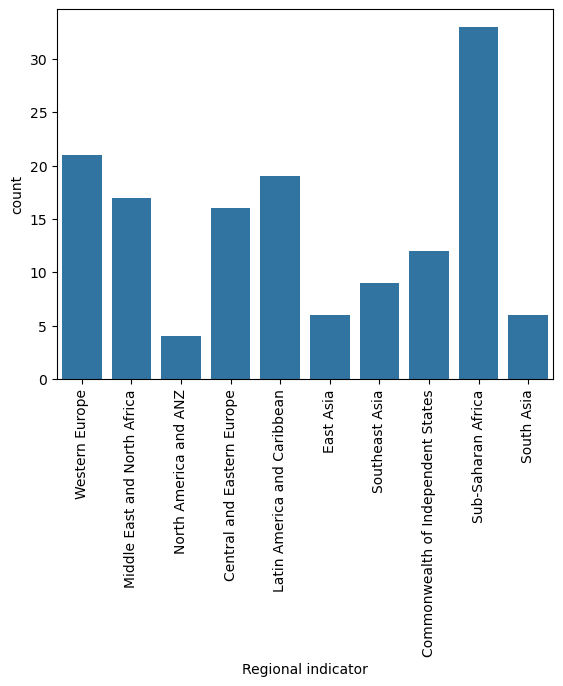

In [ ]:
# -> 종류별 갯수 : countplot
# -> 해당한즌 정보 : Regional indicator
sns.countplot(data=data_happy_tot,x="Regional indicator")
plt.xticks(rotation=90)
plt.show()

#### 2-4) 위의 그래프가 너무 랜덤이니...값을 기준으로 정렬!!!

In [ ]:
data_happy_tot["Regional indicator"].value_counts()

Regional indicator
Sub-Saharan Africa                    33
Western Europe                        21
Latin America and Caribbean           19
Middle East and North Africa          17
Central and Eastern Europe            16
Commonwealth of Independent States    12
Southeast Asia                         9
East Asia                              6
South Asia                             6
North America and ANZ                  4
Name: count, dtype: int64

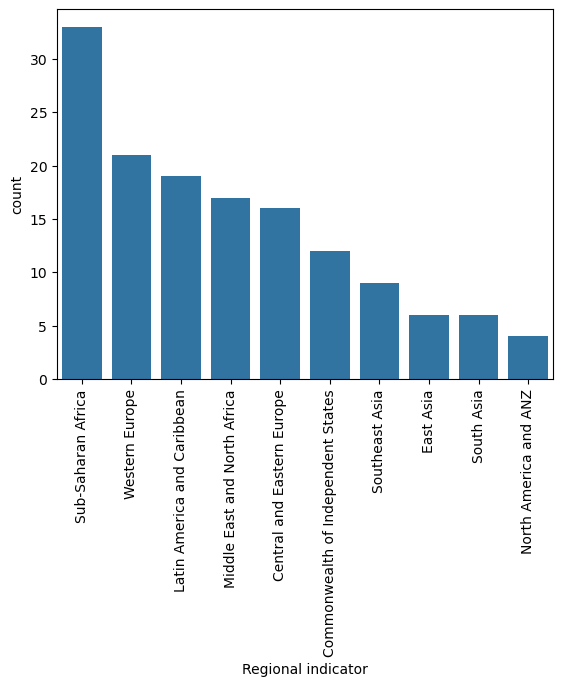

In [ ]:
# -> 정렬된 상태로 그래프를 보이기 위해서 처리~
# # value_counts를 하면 자동적으로 정렬을 해주기 떄문에!!!
# 그 정보를 order에 직접 작성하여 넘겨준다!!!
sns.countplot(data=data_happy_tot,x="Regional indicator",order = data_happy_tot["Regional indicator"].value_counts().index)
plt.xticks(rotation=90)
plt.show()


In [ ]:
# value_counts를 하면 자동적으로 정렬을 해주기 떄문에!!!
data_happy_tot["Regional indicator"].value_counts().index

Index(['Sub-Saharan Africa', 'Western Europe', 'Latin America and Caribbean',
       'Middle East and North Africa', 'Central and Eastern Europe',
       'Commonwealth of Independent States', 'Southeast Asia', 'East Asia',
       'South Asia', 'North America and ANZ'],
      dtype='object', name='Regional indicator')

<Axes: xlabel='Regional indicator'>

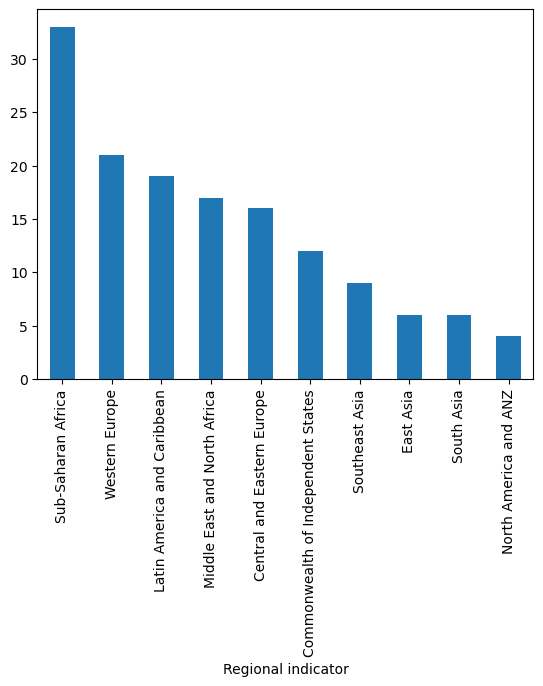

In [ ]:
# 참고2) 간단하게 pandas의 plot 중에서 bar를 활용해서 처리!!!

data_happy_tot["Regional indicator"].value_counts().plot(kind="bar")

In [ ]:
data_happy_tot.columns

Index(['RANK', 'Country', 'Happiness score', 'Whisker-high', 'Whisker-low',
       'Dystopia (1.83) + residual', 'Explained by: GDP per capita',
       'Explained by: Social support', 'Explained by: Healthy life expectancy',
       'Explained by: Freedom to make life choices',
       'Explained by: Generosity', 'Explained by: Perceptions of corruption',
       'Country name', 'Regional indicator'],
      dtype='object')

### 3) Happiness score", "Explained by: GDP per capita의 boxplot을 보자

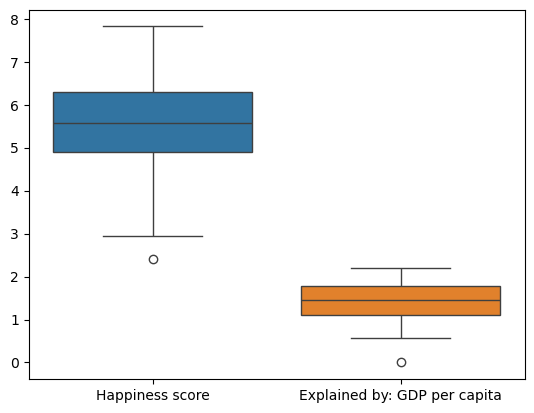

In [ ]:
# 여러 컬럼에 대한 boxplot
# 간단하게 1개의 박스에 여러 컬럼을 보기 위해서는
# df를 보고자 하는 것으로 추리고 전체를 boxplot화 시킨다..

cols = ["Happiness score","Explained by: GDP per capita"]
sns.boxplot(data= data_happy_tot.loc[:,cols])
plt.show()

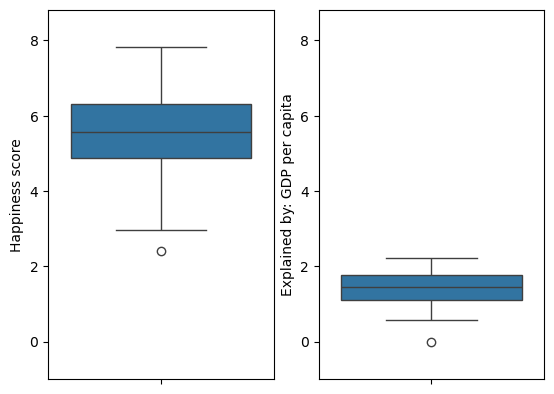

In [ ]:


# 각 영역을 돌리면서 주어진 값들에 처리한 값들을 바탕으로
# y의 값의 범위를 지정해주기 위해서!!!

cols = ["Happiness score","Explained by: GDP per capita"]
fig, ax = plt.subplots( nrows=1, ncols= len(cols))

temp = [] # --> 각기 변수들만다 min,max 기록해두기 위한 변수!!!
for idx, col in enumerate(cols):
    sns.boxplot( data = data_happy_tot, y = col, ax=ax[idx])
    temp.append( min( data_happy_tot[col]))
    temp.append( max( data_happy_tot[col]))

gap = 1
for i_ax in ax:
    i_ax.set_ylim( min(temp)-gap, max(temp)+gap)
plt.show()


### 4) Happiness score", "Explained by: GDP per capita"의 관계를 scatter 그래프로 보자..

<Axes: xlabel='Explained by: GDP per capita', ylabel='Happiness score'>

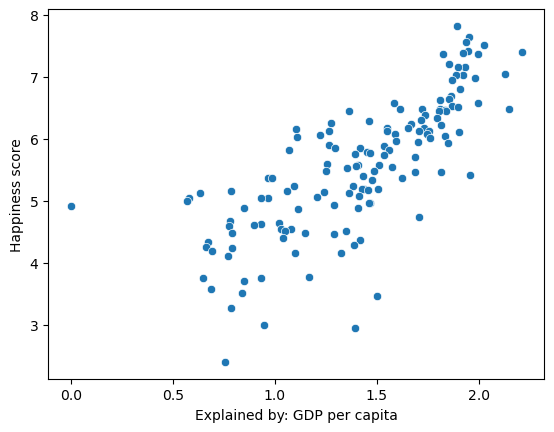

In [ ]:
cols = ["Happiness score","Explained by: GDP per capita"]
sns.scatterplot( data=data_happy_tot, x=cols[1], y =cols[0])

### 5) Happiness score", "'Explained by: Healthy life expectancy' 건강과의 관계를 보자

<Axes: xlabel='Explained by: Healthy life expectancy', ylabel='Happiness score'>

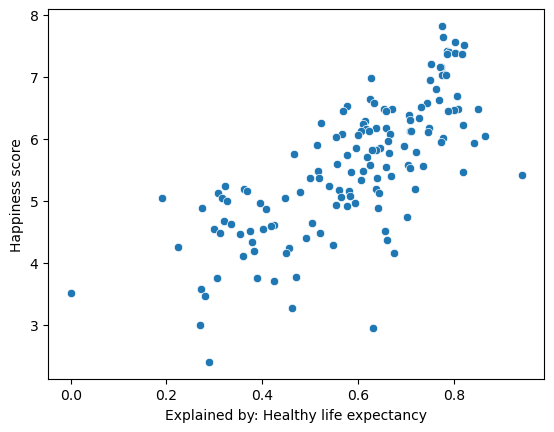

In [ ]:
cols = ["Happiness score","Explained by: Healthy life expectancy"]
sns.scatterplot( data=data_happy_tot, x=cols[1], y =cols[0])

### 6) 앞의 경제/ 건강/ 행복도의 관계를 보자

In [ ]:
cols = ["Happiness score","Explained by: GDP per capita","Explained by: Healthy life expectancy"]
data_happy_tot.loc[:,cols].corr()  #상관계수

,Happiness score,Explained by: GDP per capita,Explained by: Healthy life expectancy
Happiness score,1.000000,0.763676,0.740273
Explained by: GDP per capita,0.763676,1.000000,0.815517
Explained by: Healthy life expectancy,0.740273,0.815517,1.000000


In [ ]:
data_happy_tot.corr()
#-->pandas 버전에 따라서 DF 수치형이 아닌 변수가 있으면 에러를 던지는 버전도 있고, 아닌 경우도 있다.

ValueError: could not convert string to float: 'Finland'

### 3) 2022년에서 가장 행복 // 가장불행하다는 나라는?

<Axes: >

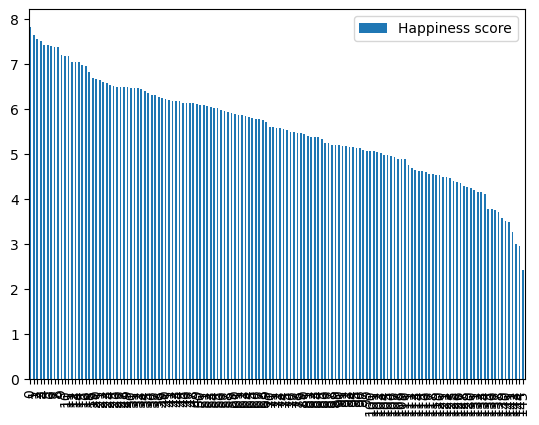

In [ ]:
# 일단 그려는 보는데,,,나라가 백 몇십개가 되니 너무 많아서 잘 안 보이게 된다!!!
cols = ["Country","Happiness score"]
data_happy_tot.loc[:,cols].sort_values(by="Happiness score", ascending=False).plot(kind="bar")

### 4) 2022년도에서 가장 행복한 나라 top 10, 가장 불행한 나라 top10 선정하자..

#### 4-1) 일단 위의 결과에서 행복 top10/ 불행 top10을 선정하자..

In [ ]:
data_happy_tot.head(10).index

Index([0, 1, 2, 3, 4, 5, 6, 7, 8, 9], dtype='int64')

In [ ]:
# 에러가 발생을 할 것인데,,,
# 그 이유는 앞에서 뭔가 대충 넘긴 부분에 대한 비용 지불을 함!!!
cols = ["Country","Happiness score"]
cnt = 10
top_bottom = list(data_happy_tot.head(cnt).index) + list(data_happy_tot.tail(cnt).index)
data_happy_tot.loc[:, cols].sort_values(by="Happiness score",ascending=False).iloc[top_bottom,:]



IndexError: positional indexers are out-of-bounds

In [ ]:
# *** 위에서 어느 부분에서 에러가 발생을 하였는지 확인을 하기 위해서 아래 코드를 보면 됨...



[0, 1, 2, 3, 4, 141, 142, 143, 144, 145]


,Country,Happiness score
0,Finland,7.8210
1,Denmark,7.6362
2,Iceland,7.5575
3,Switzerland,7.5116
4,Netherlands,7.4149
...,...,...
141,Botswana,3.4711
142,Rwanda,3.2682
143,Zimbabwe,2.9951
144,Lebanon,2.9553


In [ ]:
# ---> 그래서 reset_index를 안 하기 위해서는 그냥 지금 있는 정보가
#      태생적으로 가지는 정수인덱스가 아니라 그냥 내가 만든 인덱스라고 우기면 가능하기는 함!!!
# ---> 그러나 그러면 좀 혼동이 발생할 수 있으니...여기서는 다시 reset_index를 처리하려고 함!!!!


,Country,Happiness score
0,Finland,7.8210
1,Denmark,7.6362
2,Iceland,7.5575
3,Switzerland,7.5116
4,Netherlands,7.4149
141,Botswana,3.4711
142,Rwanda,3.2682
143,Zimbabwe,2.9951
144,Lebanon,2.9553
145,Afghanistan,2.4038


In [ ]:
#오해의 소지가 없으려면,,,다시 세팅을 하는 것이 나음!
data_happy_tot.reset_index(inplace=True)
data_happy_tot.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 143 entries, 0 to 142
Data columns (total 15 columns):
 #   Column                                      Non-Null Count  Dtype  
---  ------                                      --------------  -----  
 0   index                                       143 non-null    int64  
 1   RANK                                        143 non-null    int64  
 2   Country                                     143 non-null    object 
 3   Happiness score                             143 non-null    float64
 4   Whisker-high                                143 non-null    float64
 5   Whisker-low                                 143 non-null    float64
 6   Dystopia (1.83) + residual                  143 non-null    float64
 7   Explained by: GDP per capita                143 non-null    float64
 8   Explained by: Social support                143 non-null    float64
 9   Explained by: Healthy life expectancy       143 non-null    float64
 10  Explained by: 

In [ ]:
cols = ["Country","Happiness score"]
cnt = 5
top_bottom = list(data_happy_tot.head(cnt).index) + list(data_happy_tot.tail(cnt).index)
data_happy_tot.loc[:, cols].sort_values(by="Happiness score",ascending=False).iloc[top_bottom,:]


,Country,Happiness score
0,Finland,7.8210
1,Denmark,7.6362
2,Iceland,7.5575
3,Switzerland,7.5116
4,Netherlands,7.4149
138,Botswana,3.4711
139,Rwanda,3.2682
140,Zimbabwe,2.9951
141,Lebanon,2.9553
142,Afghanistan,2.4038


#### 4-2) 위에서 찾은 각기 행복 10개국, 불행 10개국에 대한 그래프 그리자.

<Axes: xlabel='Country'>

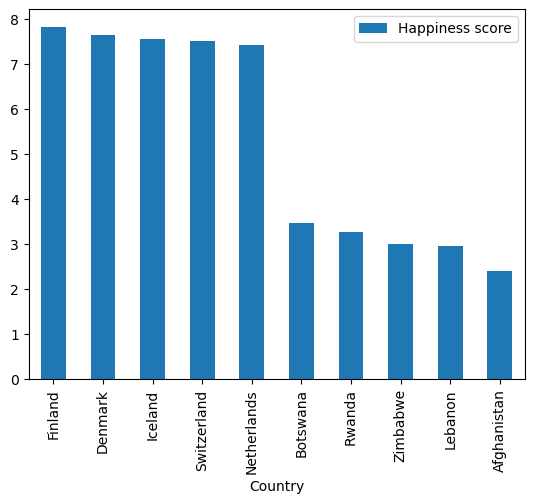

In [ ]:
cols = ["Country","Happiness score"]
cnt = 5
top_bottom = list(data_happy_tot.head(cnt).index) + list(data_happy_tot.tail(cnt).index)
data_happy_tot.loc[:, cols].sort_values(by="Happiness score",ascending=False).iloc[top_bottom,:].plot(kind="bar", x="Country")

#### 참고) seaborn에서 처리...

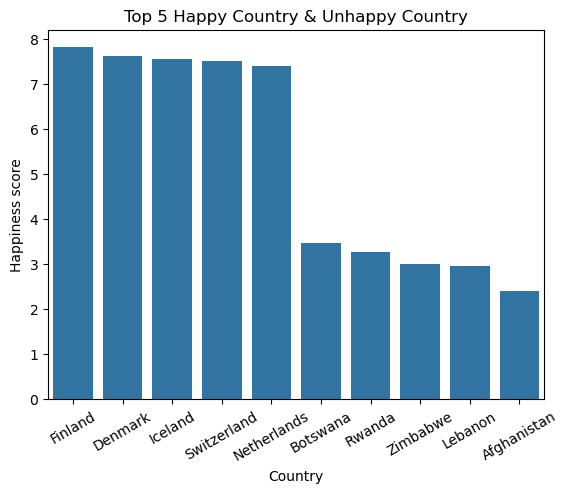

In [ ]:
cols = ["Country","Happiness score"]
cnt = 5
top_bottom = list(data_happy_tot.head(cnt).index) + list(data_happy_tot.tail(cnt).index)
tb_df = data_happy_tot.loc[:, cols].sort_values(by="Happiness score",ascending=False).iloc[top_bottom,:]

sns.barplot( data =tb_df, x="Country", y="Happiness score" )
plt.xticks(rotation=30)
plt.title("Top 5 Happy Country & Unhappy Country")
plt.show()

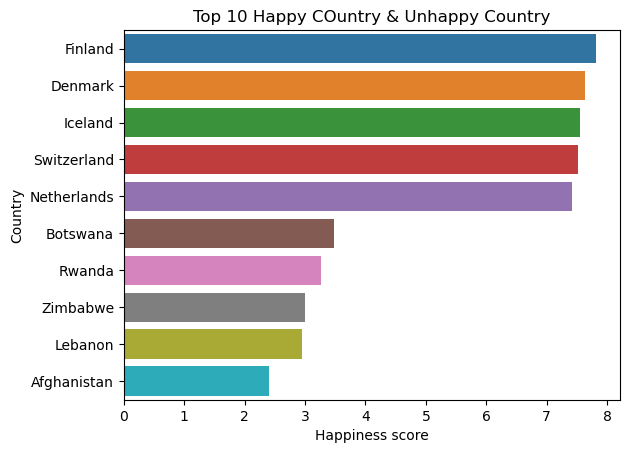

In [ ]:
# 위에서와 달리 축면 변경해서 보자...


### 5) 2022년 Regional Indicator 별로 Happiness score"의 분포를 보자~~

<Axes: xlabel='Happiness score', ylabel='Density'>

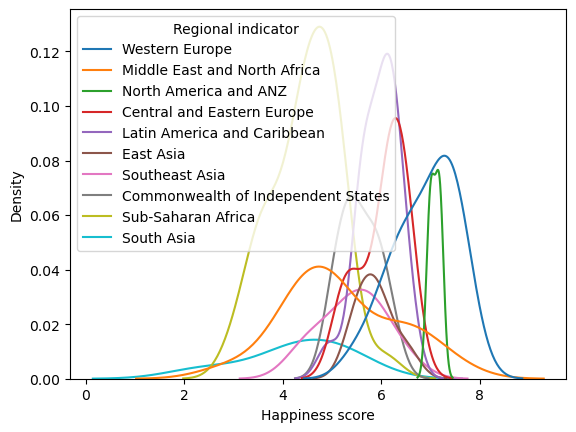

In [ ]:
# kdeplot을 이용을 해서 지역별 각 국가의 정보를 바탕으로
# 분포를 추청해서 그려보자~~~
sns.kdeplot(data=data_happy_tot,
            x="Happiness score",
            hue ="Regional indicator")

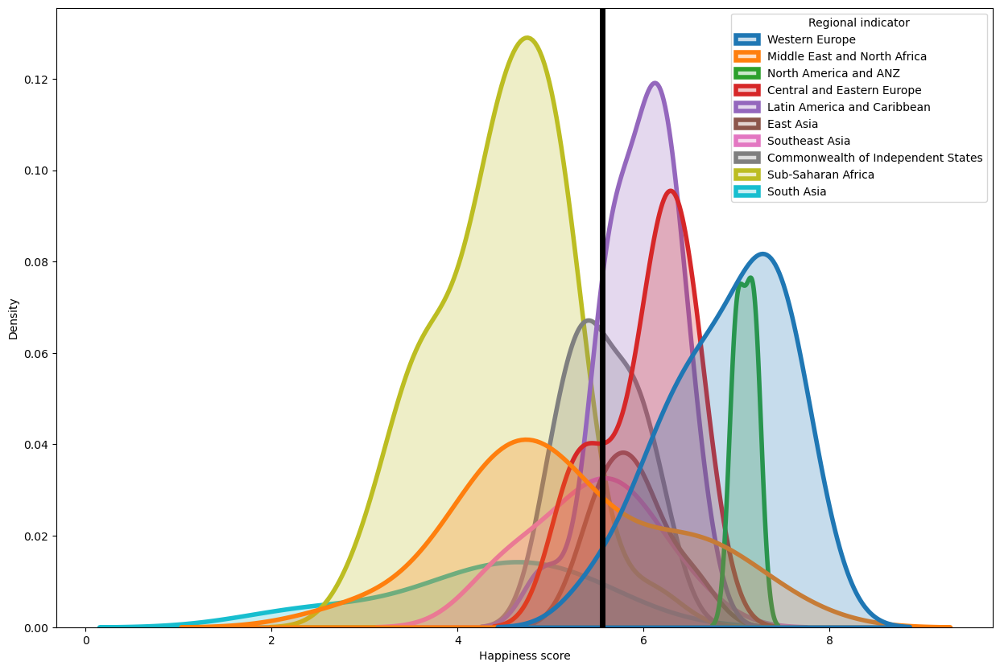

In [ ]:
# kdeplot을 이용을 해서 지역별 각 국가의 정보를 바탕으로
# 분포를 추청해서 그려보자~~~
# --> 위의 그래프를 보면 옆으로 좀 길게 그래프를 그려야 잘 보일 것 같아서
#     사이즈에 대한 변경을 하자.
plt.figure(figsize=(15,10))
sns.kdeplot( data= data_happy_tot,
           x="Happiness score",
           hue="Regional indicator",
           fill=True,
           lw=4)
# 중간에 전체 모든 나라의 Ladder score의 평균을 가지고 그려보자.

plt.axvline( data_happy_tot["Happiness score"].mean(), color="black", lw=5)
plt.show()

# kdeplot을 이용을 해서 지역별 각 국가의 정보를 바탕으로
# 분포를 추청해서 그려보자~~~
# --> 위의 그래프를 보면 옆으로 좀 길게 그래프를 그려야 잘 보일 것 같아서
#     사이즈에 대한 변경을 하자.
# --> 꾸며보자~~
plt.figure(figsize=(15,10))
sns.kdeplot(data=data_happy_tot,
            x="Happiness score",
            hue ="Regional indicator"
            fill=True,
            lw=4)


# 중간에 전체 모든 나라의 Ladder score의 평균을 가지고 그려보자.

plt.axvline(data_happy_tot["Happiness score"].mean(),color="black",lw=5)
plt.show()

### 6) 가장 generous인 나라와 가장 ungenerous인 나라는 2022년도에서

Index(['index', 'RANK', 'Country', 'Happiness score', 'Whisker-high',
       'Whisker-low', 'Dystopia (1.83) + residual',
       'Explained by: GDP per capita', 'Explained by: Social support',
       'Explained by: Healthy life expectancy',
       'Explained by: Freedom to make life choices',
       'Explained by: Generosity', 'Explained by: Perceptions of corruption',
       'Country name', 'Regional indicator'],
      dtype='object')

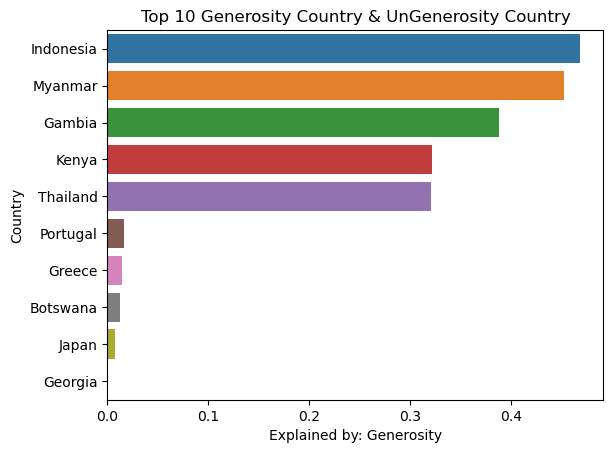

### 7) 2022년도에서 Generous의 지역별 분포 Regional Indicator

Index(['index', 'RANK', 'Country', 'Happiness score', 'Whisker-high',
       'Whisker-low', 'Dystopia (1.83) + residual',
       'Explained by: GDP per capita', 'Explained by: Social support',
       'Explained by: Healthy life expectancy',
       'Explained by: Freedom to make life choices',
       'Explained by: Generosity', 'Explained by: Perceptions of corruption',
       'Country name', 'Regional indicator'],
      dtype='object')

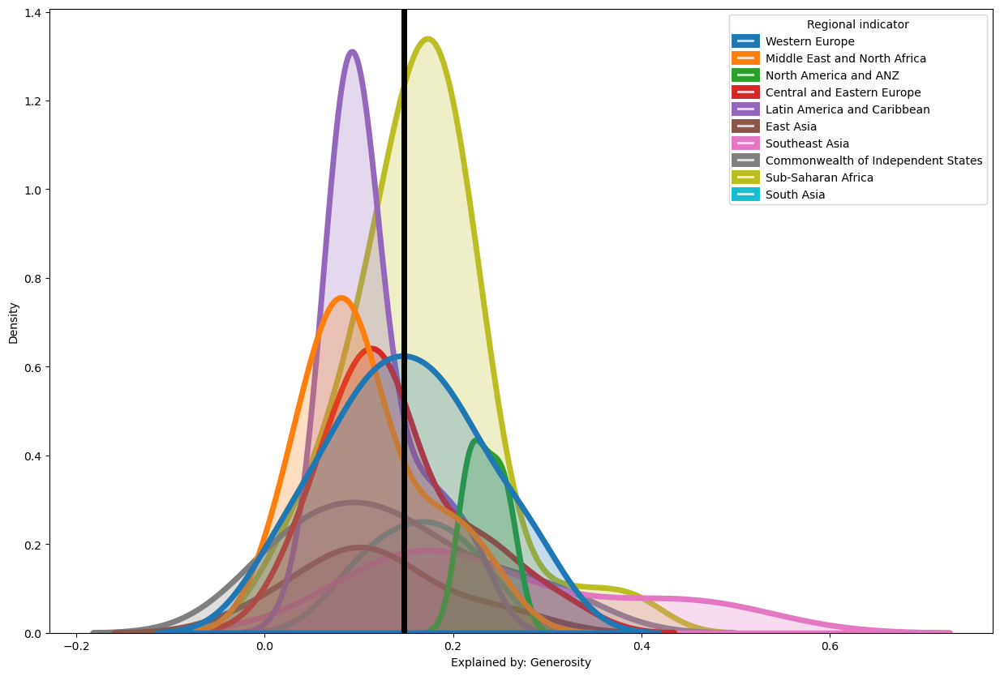

In [ ]:
# 위에서 한 대로 그리고..


# 중간에 전체 모든 나라의 Ladder score의 평균을 가지고 그려보자.



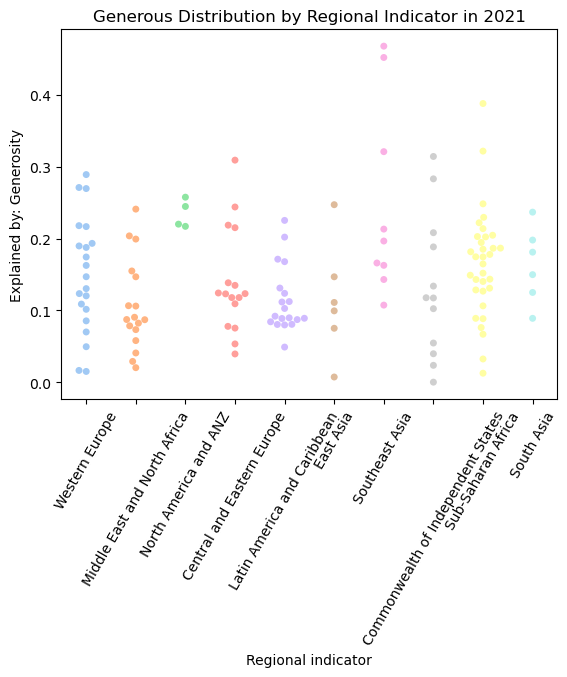

In [ ]:
# 기존에는 pallette에서 색상의 패턴을 지정을 해도 되었는데,
# 지금 버전에서는 hue를 지정을 하라고 하였기에
# hue를 지정을 하고, 범례에 대해서는 생략을 하였음.\


### 8) year에 따라서 국가별에 대한 Happiness score의 행복지수의 변화를 지도 그래프에 그리고 yeare에 따라서 보자. --> 2022년도 1개년도가 아니라 지난 년도별 데이터가 있는 것에서 해야함!!

* data_happy_log 에 나라별로 연도에 따른 값들 기록

`주의사항1` 국가별 년도에 따른 자료들이 정리된 것은 위에서 data_happy_log에 존재<br>
`주의사항2` data_happy_log에서는 행복도의 컬럼 이름이 과거의 컬럼명이 Life Ladder를 사용함!!!!

In [ ]:
# 잠시 data_happy_log 에서 나라별 year에 따라서 어떻게 데이터가 들어있는지 확인
data_happy_log[data_happy_log["Country name"]=="Afghanistan"]

,Country name,year,Life Ladder,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Generosity,Perceptions of corruption,Positive affect,Negative affect,Confidence in national government
0,Afghanistan,2008,3.723590,7.302574,0.450662,50.500000,0.718114,0.173169,0.881686,0.414297,0.258195,0.612072
1,Afghanistan,2009,4.401778,7.472446,0.552308,50.799999,0.678896,0.195469,0.850035,0.481421,0.237092,0.611545
2,Afghanistan,2010,4.758381,7.579183,0.539075,51.099998,0.600127,0.125859,0.706766,0.516907,0.275324,0.299357
3,Afghanistan,2011,3.831719,7.552006,0.521104,51.400002,0.495901,0.167723,0.731109,0.479835,0.267175,0.307386
4,Afghanistan,2012,3.782938,7.637953,0.520637,51.700001,0.530935,0.241247,0.775620,0.613513,0.267919,0.435440
5,Afghanistan,2013,3.572100,7.657503,0.483552,52.000000,0.577955,0.066344,0.823204,0.547417,0.273328,0.482847
6,Afghanistan,2014,3.130896,7.650827,0.525568,52.299999,0.508514,0.109215,0.871242,0.491641,0.374861,0.409048
7,Afghanistan,2015,3.982855,7.634466,0.528597,52.599998,0.388928,0.085082,0.880638,0.491410,0.339276,0.260557
8,Afghanistan,2016,4.220169,7.629037,0.559072,52.924999,0.522566,0.047488,0.793246,0.501409,0.348332,0.324990
9,Afghanistan,2017,2.661718,7.629684,0.490880,53.250000,0.427011,-0.116068,0.954393,0.435270,0.371326,0.261179


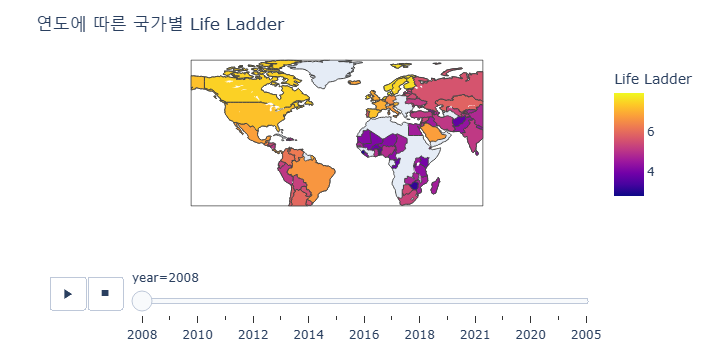

In [ ]:
# 그냥 데이터를 밀어 넣어버리면, 나라별로 이름을 중심으로 각기 year의 값들이
# 달라서 밑에서 연도별로 볼 때 제대로 안 들어간다;;;;
# ㅜㅜ
# 주의!!!!!)
# 그냥 데이터를 밀어 넣게 되면, 아래와 같이 year의 순서가 꼬이게 된다!!!!

# 참고) locationmode는 어떠한 방식으로 지역을 할 것인지인데, 이름으로 할 때의
# country names의 파라미터의 값이지, 컬럼 이름이 아님에 유의할 것!!!!
# https://plotly.com/python-api-reference/generated/plotly.express.choropleth.html

# data --> DF
# location : 어떠한 정보를 가지고 지도를 할지
# color : 색상에 대한 농도의 기준
# locatrionmode : ISO-3, USA-states,country names 등과 같이 어떤 방식인지..
# animation_frame :  어떤 부분으로 볼지...

fig = px.choropleth(data_happy_log,locations="Country name",color="Life Ladder",locationmode="country names",animation_frame="year")
fig.update_layout(title="연도에 따른 국가별 Life Ladder")
fig.show()

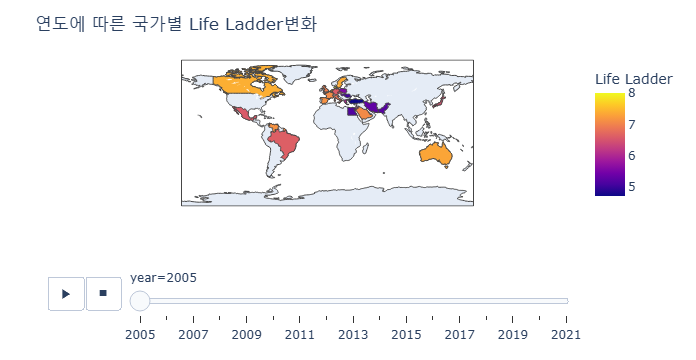

In [ ]:
# ******
# 중요!!!!)
# year에 대해서 넘기면서 볼 것이기에 아래와 같이
# 정렬을 하고 처리해야 함!!!!!!!
fig = px.choropleth(data_happy_log.sort_values("year"),
                    locations = "Country name",
                    color = "Life Ladder",
                    locationmode = "country names",
                    animation_frame = "year")
fig.update_layout(title = "연도에 따른 국가별 Life Ladder변화")
fig.show()

### 9) year에 따라서 국가별에 대한 Generosity 변화를 지도 그래프에 그리고 yeare에 따라서 보자

* `주의사항` 앞에서와 같이 data_happy_log에서의 컬럼명을 확인하고 할 것!!!

Index(['Country name', 'year', 'Life Ladder', 'Log GDP per capita',
       'Social support', 'Healthy life expectancy at birth',
       'Freedom to make life choices', 'Generosity',
       'Perceptions of corruption', 'Positive affect', 'Negative affect',
       'Confidence in national government'],
      dtype='object')

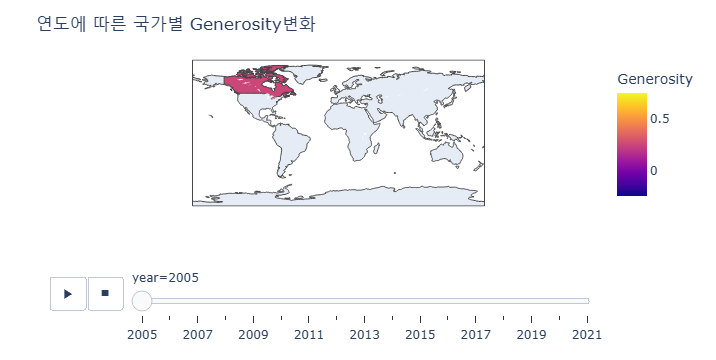

In [ ]:
fig = px.choropleth(data_happy_log.sort_values("year"),
                    locations = "Country name",
                    color = "Generosity",
                    locationmode = "country names",
                    animation_frame = "year")
fig.update_layout(title = "연도에 따른 국가별 Generosity변화")
fig.show()

### 10) 인구의 정보를 같이 넣어서 보고 싶다!!!

* 참고) 인구 관련 데이터는 https://data.worldbank.org/indicator/SP.POP.TOTL?end=2021&start=1960&view=chart 사이트에 들어가서 excel로 다운 받기..

#### 10-1) 관련 데이터 가지고 오기!!

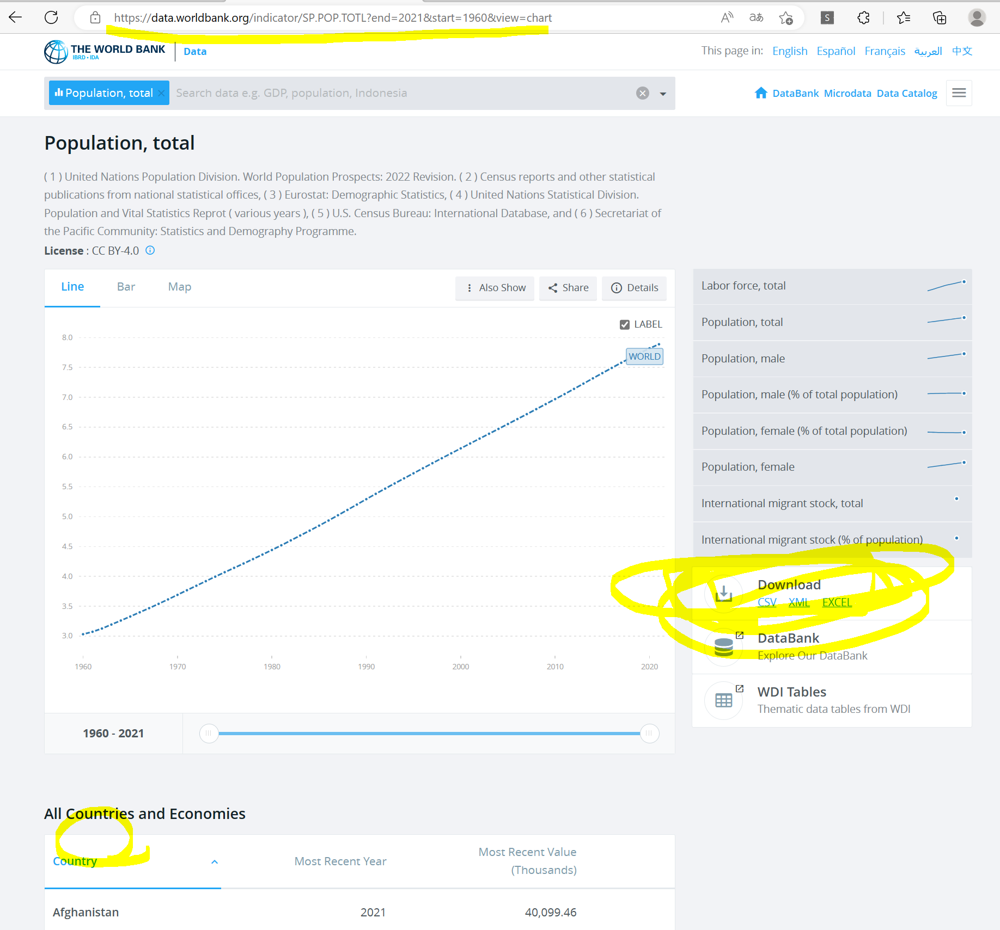

In [ ]:
Image("img/img_07.png")

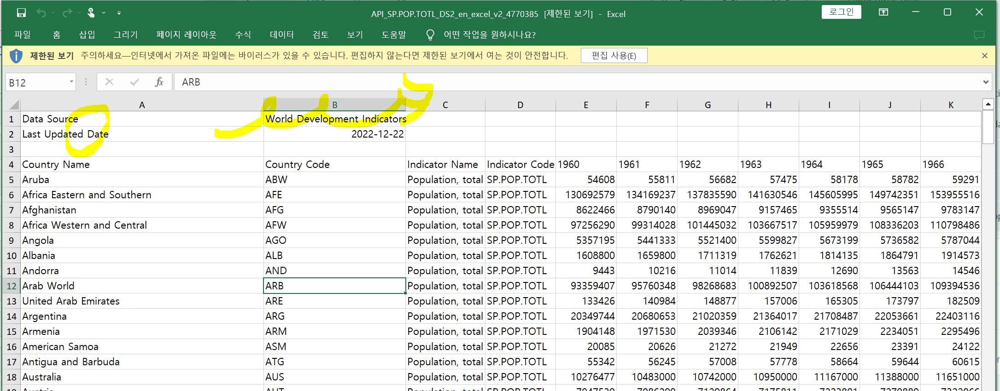

In [ ]:
Image("img/img_08.png")

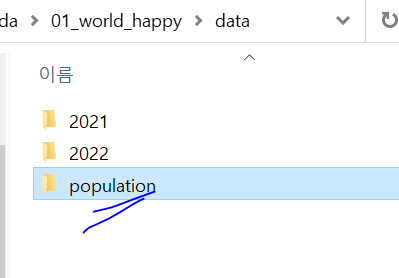

In [ ]:
# 아래와 같은 경로에 다운 받아 두기!!!
Image("img/img_09.png")

In [ ]:
pop_path = 'data/population/API_SP.POP.TOTL_DS2_en_excel_v2_4770385.xls'
pop_df = pd.read_excel(pop_path, sheet_name="Data",skiprows=3)
pop_df.head()

,Country Name,Country Code,Indicator Name,Indicator Code,1960,1961,1962,1963,1964,1965,...,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021
0,Aruba,ABW,"Population, total",SP.POP.TOTL,54608.0,55811.0,56682.0,57475.0,58178.0,58782.0,...,102112.0,102880.0,103594.0,104257.0,104874.0,105439.0,105962.0,106442.0,106585.0,106537.0
1,Africa Eastern and Southern,AFE,"Population, total",SP.POP.TOTL,130692579.0,134169237.0,137835590.0,141630546.0,145605995.0,149742351.0,...,552530654.0,567891875.0,583650827.0,600008150.0,616377331.0,632746296.0,649756874.0,667242712.0,685112705.0,702976832.0
2,Afghanistan,AFG,"Population, total",SP.POP.TOTL,8622466.0,8790140.0,8969047.0,9157465.0,9355514.0,9565147.0,...,30466479.0,31541209.0,32716210.0,33753499.0,34636207.0,35643418.0,36686784.0,37769499.0,38972230.0,40099462.0
3,Africa Western and Central,AFW,"Population, total",SP.POP.TOTL,97256290.0,99314028.0,101445032.0,103667517.0,105959979.0,108336203.0,...,376797999.0,387204553.0,397855507.0,408690375.0,419778384.0,431138704.0,442646825.0,454306063.0,466189102.0,478185907.0
4,Angola,AGO,"Population, total",SP.POP.TOTL,5357195.0,5441333.0,5521400.0,5599827.0,5673199.0,5736582.0,...,25188292.0,26147002.0,27128337.0,28127721.0,29154746.0,30208628.0,31273533.0,32353588.0,33428486.0,34503774.0


#### 10-2) 관련 인구 최근 정보로 data_happy_log 데이터에 나라명 // 년도에 맞춰서 인구정보 추가하기!!

In [ ]:
data_happy_log.head()

,Country name,year,Life Ladder,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Generosity,Perceptions of corruption,Positive affect,Negative affect,Confidence in national government
0,Afghanistan,2008,3.723590,7.302574,0.450662,50.500000,0.718114,0.173169,0.881686,0.414297,0.258195,0.612072
1,Afghanistan,2009,4.401778,7.472446,0.552308,50.799999,0.678896,0.195469,0.850035,0.481421,0.237092,0.611545
2,Afghanistan,2010,4.758381,7.579183,0.539075,51.099998,0.600127,0.125859,0.706766,0.516907,0.275324,0.299357
3,Afghanistan,2011,3.831719,7.552006,0.521104,51.400002,0.495901,0.167723,0.731109,0.479835,0.267175,0.307386
4,Afghanistan,2012,3.782938,7.637953,0.520637,51.700001,0.530935,0.241247,0.775620,0.613513,0.267919,0.435440


In [ ]:
###--> 여기서 선택이 있음!!!
# 방법1) data_happy_log를 돌아가면서 정보를 찾아서 붙이는 방법!!
data_happy_log["pop"] = 0
pop_col_idx = data_happy_log.columns.get_loc("pop")
for i in range( len(data_happy_log)):
    i_data = data_happy_log.iloc[i,:]
    i_data_country = i_data["Country name"]
    i_data_year = i_data["year"]
    # --> pop_df에 가서 해당한느 정보를 찾아와야 함..11
    temp = pop_df[ pop_df.loc[:,"Country Name"]==i_data_country].loc[:, str(i_data_year)]
    if len(temp) != 0: # --> 원하는 국가와 연도에 인구 정보가 있을 때면,,,,
        data_happy_log.iat[i, pop_col_idx] = int(temp)
print("Done!!!")

C:\Users\NT551_11TH\AppData\Local\Temp\ipykernel_6304\2883282583.py:12: FutureWarning:

Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead



Done!!!


In [ ]:
data_happy_log.head()

,Country name,year,Life Ladder,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Generosity,Perceptions of corruption,Positive affect,Negative affect,Confidence in national government,pop
0,Afghanistan,2008,3.723590,7.302574,0.450662,50.500000,0.718114,0.173169,0.881686,0.414297,0.258195,0.612072,26427199
1,Afghanistan,2009,4.401778,7.472446,0.552308,50.799999,0.678896,0.195469,0.850035,0.481421,0.237092,0.611545,27385307
2,Afghanistan,2010,4.758381,7.579183,0.539075,51.099998,0.600127,0.125859,0.706766,0.516907,0.275324,0.299357,28189672
3,Afghanistan,2011,3.831719,7.552006,0.521104,51.400002,0.495901,0.167723,0.731109,0.479835,0.267175,0.307386,29249157
4,Afghanistan,2012,3.782938,7.637953,0.520637,51.700001,0.530935,0.241247,0.775620,0.613513,0.267919,0.435440,30466479


In [ ]:
# 인구 정보가 매칭이 안 된 것들 확인!!!
data_happy_log[data_happy_log["pop"]==0]

,Country name,year,Life Ladder,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Generosity,Perceptions of corruption,Positive affect,Negative affect,Confidence in national government,pop
399,Congo (Brazzaville),2008,3.819792,8.409023,0.554772,52.240002,0.525747,-0.121756,NaN,0.602977,0.297790,0.318315,0
400,Congo (Brazzaville),2011,4.509824,8.544344,0.637118,53.380001,0.744807,-0.135585,0.832714,0.601303,0.287876,0.468380,0
401,Congo (Brazzaville),2012,3.919342,8.613264,0.622330,53.759998,0.772511,-0.142250,0.799654,0.546510,0.322583,0.541933,0
402,Congo (Brazzaville),2013,3.954951,8.581464,0.679935,54.139999,0.725816,-0.105489,0.751724,0.598946,0.291402,0.555940,0
403,Congo (Brazzaville),2014,4.056013,8.622066,0.685935,54.520000,0.661638,-0.138073,0.808413,0.557721,0.400229,0.483726,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2053,Yemen,2015,2.982674,7.772318,0.668683,58.400002,0.609981,-0.133034,0.829098,0.458002,0.321357,0.263297,0
2054,Yemen,2016,3.825631,7.552322,0.775407,58.174999,0.532964,-0.138727,NaN,0.401007,0.227925,0.267581,0
2055,Yemen,2017,3.253560,7.243477,0.789555,57.950001,0.595191,-0.122040,NaN,0.368106,0.295064,0.247787,0
2056,Yemen,2018,3.057514,7.443574,0.789422,57.724998,0.552726,-0.121567,0.792587,0.409410,0.314870,0.308151,0


* 위의 결과를 보니;;;이름이 메칭이 안 되는 것들 존재한다;;;ㅠㅠ

In [ ]:
len(data_happy_log[data_happy_log["pop"]==0]["Country name"].unique())

20

In [ ]:
data_happy_log[data_happy_log["pop"]==0]["Country name"].unique()

array(['Congo (Brazzaville)', 'Congo (Kinshasa)', 'Egypt', 'Gambia',
       'Hong Kong S.A.R. of China', 'Iran', 'Ivory Coast', 'Kyrgyzstan',
       'Laos', 'North Cyprus', 'Palestinian Territories', 'Russia',
       'Slovakia', 'Somaliland region', 'South Korea', 'Syria',
       'Taiwan Province of China', 'Turkey', 'Venezuela', 'Yemen'],
      dtype=object)

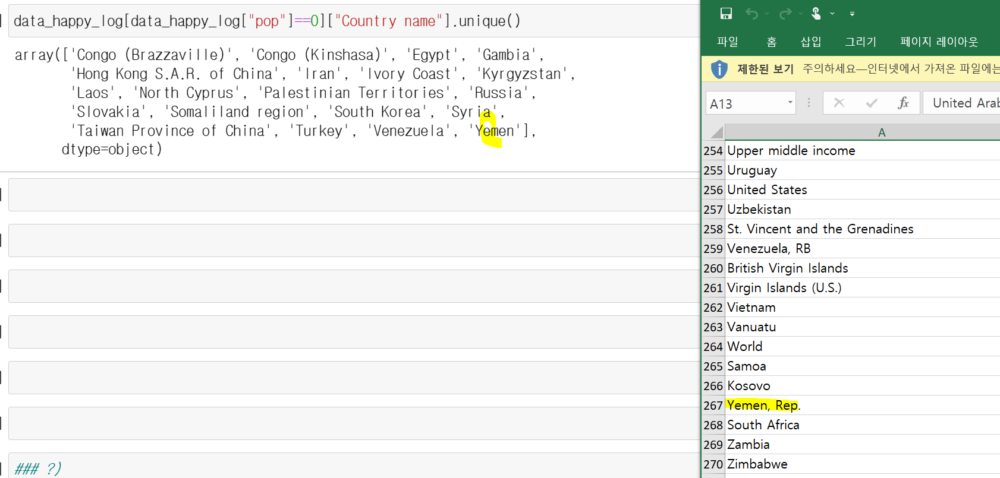

In [ ]:
Image("img/img_10.png")

* 맨 처음의 콩고의 경우에는 직접 구글링을 하면서 pop에 2개의 나라가 있는데,,어느 나라인지 보면서 매칭을 해야함!!

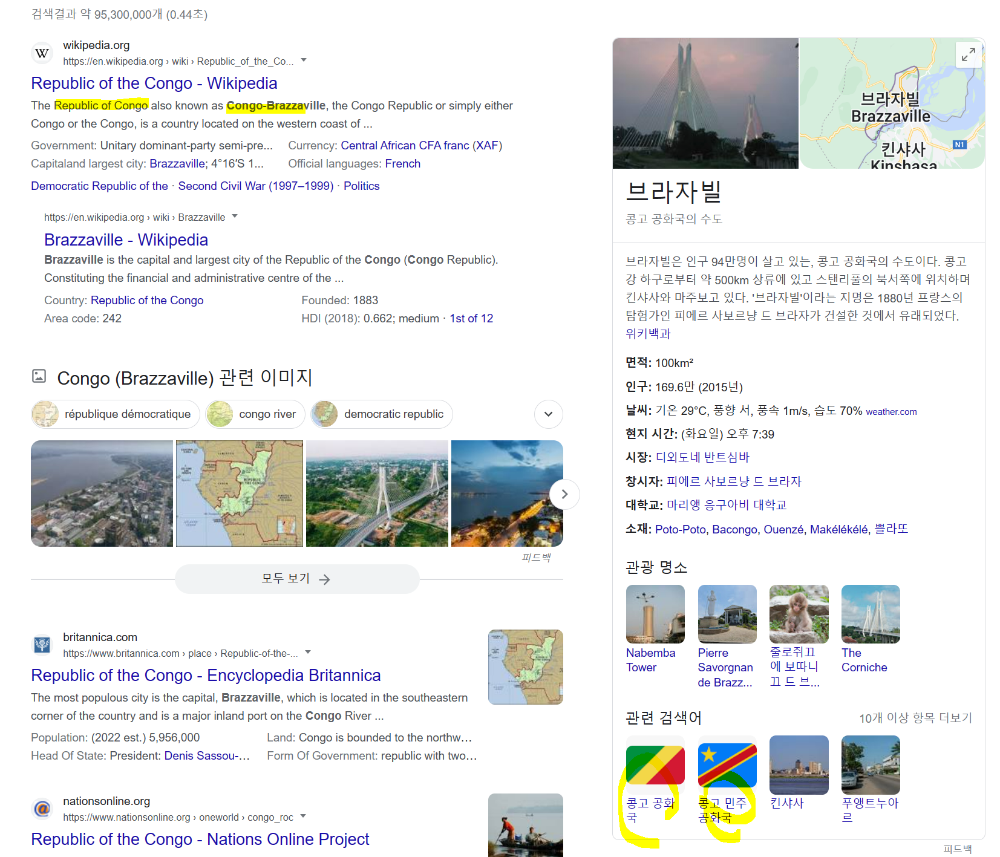

In [ ]:
Image("img/img_11.png")

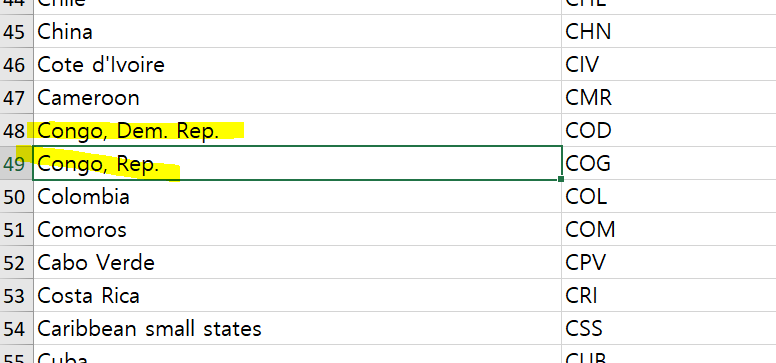

In [ ]:
Image("img/img_12.png")

* 위에서와 같이 다들 보면서 리스트업을 해야한다!!! ㅜㅜ 다 찾아가면서...직접 변경 룰을~~

array(['Congo (Brazzaville)', 'Congo (Kinshasa)', 'Egypt', 'Gambia',
       'Hong Kong S.A.R. of China', 'Iran', 'Ivory Coast', 'Kyrgyzstan',
       'Laos', 'North Cyprus', 'Palestinian Territories', 'Russia',
       'Slovakia', 'Somaliland region', 'South Korea', 'Syria',
       'Taiwan Province of China', 'Turkey', 'Venezuela', 'Yemen'],
      dtype=object)

In [ ]:
# key : happy_data_log에서의 나라이름..
# value : pop 엑셀 파일에서의 나라이름..

# Ivory Coast 는 구글 검색하면 Cote d'Ivoire임;;;
# --> 이런 식으로 다 찾아야 함;;ㅠㅠ

# Palestinian Territories은 팔레스타인 자치구역이므로..여기는 정보가 없어서 생략!!!
# "Palestinian Territories"

# 타이완도 없음..
# Taiwan Province of China"
happy_pop_dict = {"Congo (Brazzaville)" : "Congo, Rep.",
                 "Congo (Kinshasa)":"Congo, Dem. Rep.",
                 "Egypt": "Egypt, Arab Rep.",
                 "Gambia":"Gambia, The",
                 "Hong Kong S.A.R. of China": "Hong Kong SAR, China",
                 "Iran" : "Iran, Islamic Rep.",
                 "Ivory Coast": "Cote d'Ivoire",
                 "Kyrgyzstan": "Kyrgyz Republic",
                 "Laos":"Lao PDR",
                 "North Cyprus": "Cyprus",
                 "Russia" : "Russian Federation",
                 "Slovakia": "Slovak Republic",
                 "Somaliland region":"Somalia",
                 "South Korea": "Korea, Rep.",
                 "Syria" :"Syrian Arab Republic",
                 "Turkey":"Turkiye",
                "Venezuela":"Venezuela, RB",
                 "Yemen":"Yemen, Rep."}
happy_pop_dict




{'Congo (Brazzaville)': 'Congo, Rep.',
 'Congo (Kinshasa)': 'Congo, Dem. Rep.',
 'Egypt': 'Egypt, Arab Rep.',
 'Gambia': 'Gambia, The',
 'Hong Kong S.A.R. of China': 'Hong Kong SAR, China',
 'Iran': 'Iran, Islamic Rep.',
 'Ivory Coast': "Cote d'Ivoire",
 'Kyrgyzstan': 'Kyrgyz Republic',
 'Laos': 'Lao PDR',
 'North Cyprus': 'Cyprus',
 'Russia': 'Russian Federation',
 'Slovakia': 'Slovak Republic',
 'Somaliland region': 'Somalia',
 'South Korea': 'Korea, Rep.',
 'Syria': 'Syrian Arab Republic',
 'Turkey': 'Turkiye',
 'Venezuela': 'Venezuela, RB',
 'Yemen': 'Yemen, Rep.'}

In [ ]:
# 변환 함수 생성 --> 변환 표에 있으면,,,변환하는 나라명으로,,아니면 그냥 그 나라명으로..
def change_name(co_name):
    if co_name in happy_pop_dict.keys():
        return happy_pop_dict[co_name]
    else:
        return co_name

In [ ]:
# 그래서 이렇게 변환을 위한 나라명을 생성하자..
# 일단 기존의 나라의 이름을 pop_co_name이라는 새로운 컬럼에 생성...
data_happy_log["pop_co_name"] = data_happy_log["Country name"]
data_happy_log["pop_co_name"] = data_happy_log["pop_co_name"].apply(lambda x: change_name(x))
data_happy_log["pop_co_name"]

0       Afghanistan
1       Afghanistan
2       Afghanistan
3       Afghanistan
4       Afghanistan
           ...     
2084       Zimbabwe
2085       Zimbabwe
2086       Zimbabwe
2087       Zimbabwe
2088       Zimbabwe
Name: pop_co_name, Length: 2089, dtype: object

In [ ]:
# 위에서 한 것을 pop_co_name 을 바라보고 다시 수행...
###--> 여기서 선택이 있음!!!
# 방법1) data_happy_log를 돌아가면서 정보를 찾아서 붙이는 방법!!
data_happy_log["pop"] = 0
pop_col_idx = data_happy_log.columns.get_loc("pop")
for i in range( len(data_happy_log)):
    i_data = data_happy_log.iloc[i,:]
    i_data_country = i_data["pop_co_name"]
    i_data_year = i_data["year"]
    # --> pop_df에 가서 해당한느 정보를 찾아와야 함..11
    temp = pop_df[ pop_df.loc[:,"Country Name"]==i_data_country].loc[:, str(i_data_year)]
    if len(temp) != 0: # --> 원하는 국가와 연도에 인구 정보가 있을 때면,,,,
        data_happy_log.iat[i, pop_col_idx] = int(temp)
print("Done!!!")

C:\Users\NT551_11TH\AppData\Local\Temp\ipykernel_6304\1050566038.py:13: FutureWarning:

Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead



Done!!!


In [ ]:
# 아직 0인 데이터들은 우리가 정보가 없어서 할 수 없는 것들이니.... 확인..
data_happy_log[data_happy_log["pop"]==0]["Country name"].unique()

array(['Palestinian Territories', 'Taiwan Province of China'],
      dtype=object)

In [ ]:
# pop=0인 데이터를 날리자..
# & 중간에 데이터 빠지는 reset_index로 하고!!!
data_happy_log_pop = data_happy_log[data_happy_log["pop"]>0 ]
data_happy_log_pop.reset_index(inplace=True)
data_happy_log_pop.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2061 entries, 0 to 2060
Data columns (total 15 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   index                              2061 non-null   int64  
 1   Country name                       2061 non-null   object 
 2   year                               2061 non-null   int64  
 3   Life Ladder                        2061 non-null   float64
 4   Log GDP per capita                 2036 non-null   float64
 5   Social support                     2048 non-null   float64
 6   Healthy life expectancy at birth   2023 non-null   float64
 7   Freedom to make life choices       2029 non-null   float64
 8   Generosity                         1984 non-null   float64
 9   Perceptions of corruption          1948 non-null   float64
 10  Positive affect                    2037 non-null   float64
 11  Negative affect                    2045 non-null   float

#### 10-3) 그리고 지역에 대한 정보도 붙여보자..

In [ ]:
data_happy_log_pop = pd.merge(data_happy_log_pop, data_happy_2021,
                             how="left",
                             left_on="Country name",
                             right_on="Country name") # on ="Country name"
data_happy_log_pop.head()

,index,Country name,year,Life Ladder,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Generosity,Perceptions of corruption,Positive affect,Negative affect,Confidence in national government,pop,pop_co_name,Regional indicator
0,0,Afghanistan,2008,3.723590,7.302574,0.450662,50.500000,0.718114,0.173169,0.881686,0.414297,0.258195,0.612072,26427199,Afghanistan,South Asia
1,1,Afghanistan,2009,4.401778,7.472446,0.552308,50.799999,0.678896,0.195469,0.850035,0.481421,0.237092,0.611545,27385307,Afghanistan,South Asia
2,2,Afghanistan,2010,4.758381,7.579183,0.539075,51.099998,0.600127,0.125859,0.706766,0.516907,0.275324,0.299357,28189672,Afghanistan,South Asia
3,3,Afghanistan,2011,3.831719,7.552006,0.521104,51.400002,0.495901,0.167723,0.731109,0.479835,0.267175,0.307386,29249157,Afghanistan,South Asia
4,4,Afghanistan,2012,3.782938,7.637953,0.520637,51.700001,0.530935,0.241247,0.775620,0.613513,0.267919,0.435440,30466479,Afghanistan,South Asia


#### 10-4) 지역별 색생으로 구별을 하고,,,년도에 따라서 진행을 보면서... 각 나라의 인구수를 크기로 보면서..가로는  GDP, 세로는 행복지수를 그려보자...

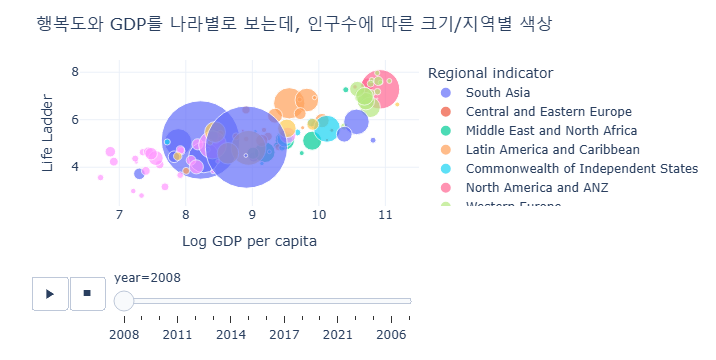

In [ ]:
fig = px.scatter(data_happy_log_pop,
                 x = "Log GDP per capita",
                 y = "Life Ladder",
                 animation_frame = "year",
                 animation_group = "Country name",
                 size = "pop",
                 template = "plotly_white",# plotly_dark
                 color = "Regional indicator",
                 hover_name = "Country name",
                 size_max = 60)
fig.update_layout(title = "행복도와 GDP를 나라별로 보는데, 인구수에 따른 크기/지역별 색상")
fig.show()

### 11) 자유지수에 따른 행복지수( 아래 그림처럼 인구에 따른 크기, 지역별 색생 지정도 같이..)

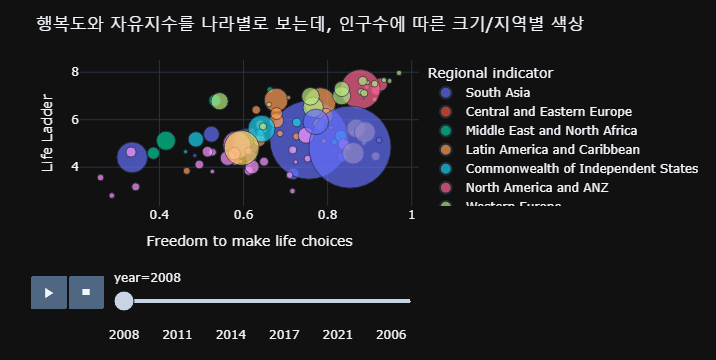

In [ ]:
fig = px.scatter(data_happy_log_pop,
                 x = "Freedom to make life choices",
                 y = "Life Ladder",
                 animation_frame = "year",
                 animation_group = "Country name",
                 size = "pop",
                 template = "plotly_dark",
                 color = "Regional indicator",
                 hover_name = "Country name",
                 size_max = 60)
fig.update_layout(title = "행복도와 자유지수를 나라별로 보는데, 인구수에 따른 크기/지역별 색상")
fig.show()

### 12) 부패지수와의 관계 Corruption

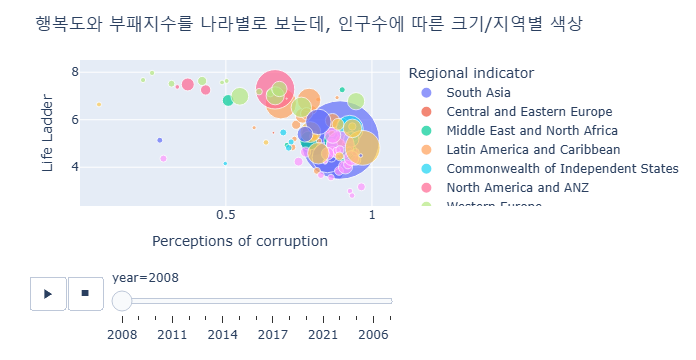

In [ ]:
fig = px.scatter(data_happy_log_pop,
                 x = "Perceptions of corruption",
                 y = "Life Ladder",
                 animation_frame = "year",
                 animation_group = "Country name",
                 size = "pop",
                 color = "Regional indicator",
                 hover_name = "Country name",
                 size_max = 60)
fig.update_layout(title = "행복도와 부패지수를 나라별로 보는데, 인구수에 따른 크기/지역별 색상")
fig.show()

### 13) 2022년도 데이터에서 각 변수들의 상과계수를 보자...

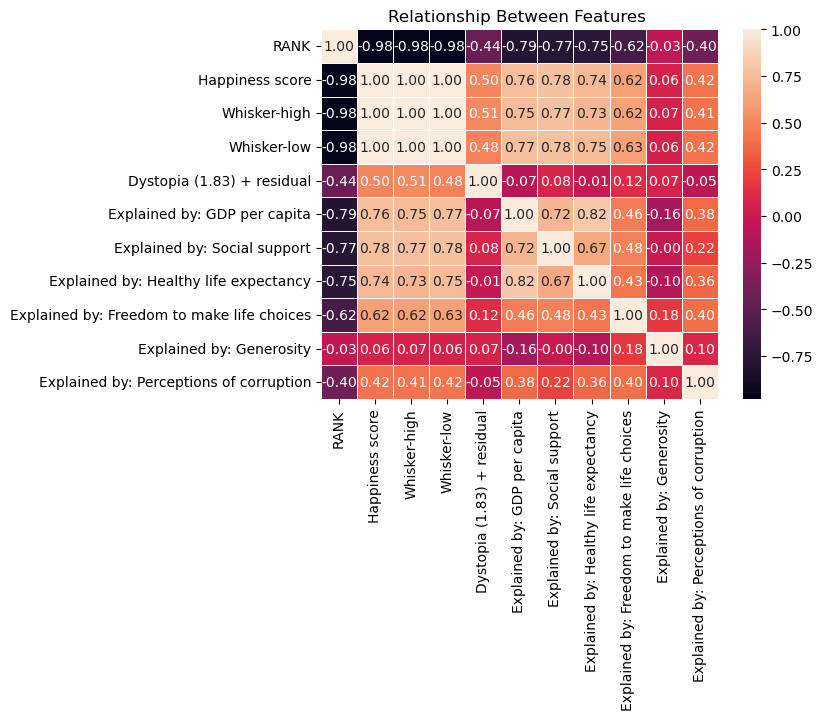

In [ ]:
sns.heatmap(data_happy.corr(numeric_only=True), annot = True, fmt = ".2f", linewidth = .7)
plt.title("Relationship Between Features ")
plt.show()

### 13-참고) 상관 계수를 기준에 맞춰서...그룹을 하자..

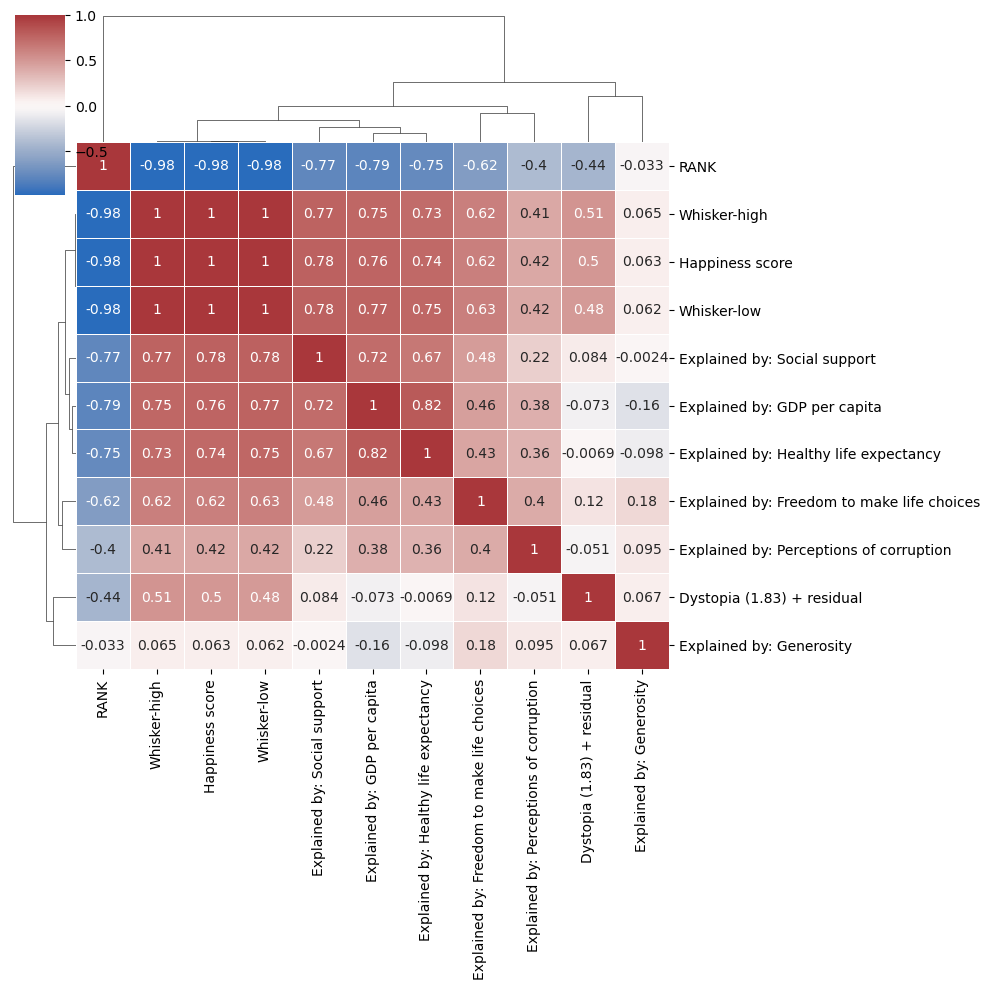

In [ ]:
sns.clustermap(data_happy.corr(numeric_only=True),
               center = 0, cmap = "vlag",
               dendrogram_ratio = (0.1, 0.2), annot = True,
               linewidths = .7, figsize=(10,10))
plt.show()